# Figures


## Imports


In [3]:
# Standard library and other common packages
import glob
import datetime
import os

import numpy as np
import matplotlib.pyplot as plt
import matplotlib.ticker as ticker
from matplotlib.dates import DateFormatter
import matplotlib.dates as md
import matplotlib.lines as mlines
from matplotlib.colors import Normalize
import matplotlib.cm as cm
import pandas as pd
import seaborn as sns
from itertools import combinations
# import tensorflow as tf
# from tensorflow.keras.models import Sequential
# from tensorflow.keras.layers import (
#     TimeDistributed,
#     LSTM,
#     Dense,
#     Flatten,
#     Conv1D,
#     Reshape,
#     Dropout,
#     Concatenate,
# )
from PIL import Image, ImageFont
from scipy import stats

from sklearn.preprocessing import MinMaxScaler

# other packages
import dask.dataframe as dd
# import neptune
import statsmodels.api as sm
from statsmodels.formula.api import ols
import h5py
from tqdm.notebook import tqdm

# local files
import constants
# from solarprophet import TabularTest
import utils
import common_params

# declarations
fig_dir = os.path.join("Figures")

rng = np.random.default_rng(seed=42)

### Data

Load data, save as hdf5 file if it is not already for quicker access


In [2]:
data_df = utils.load_joint_data(constants.JOINT_DATA_H5_PATH)
runs_table_df = utils.load_neptune_runs()

Loading .h5 dataset
https://app.neptune.ai/HorizonPSE/SolarProphet-II/


/Users/jeh/Library/CloudStorage/OneDrive-TheUniversityofTexasatAustin/business/UTexas/projects/TabularSolarForecast/utils.py:109: PerformanceWarning: 
your performance may suffer as PyTables will pickle object types that it cannot
map directly to c-types [inferred_type->mixed,key->block1_values] [items->Index(['sys/description', 'sys/hostname', 'sys/id', 'sys/name', 'sys/owner',
       'sys/state', 'sys/tags', 'history', 'loss function', 'name',
       ...
       'monitoring/f4f4527d/tid', 'monitoring/f6922af5/hostname',
       'monitoring/f6922af5/pid', 'monitoring/f6922af5/tid',
       'monitoring/f8b2abf9/hostname', 'monitoring/f8b2abf9/pid',
       'monitoring/f8b2abf9/tid', 'monitoring/stderr', 'monitoring/stdout',
       'monitoring/traceback'],
      dtype='object', length=168)]

  runs_table_df.to_hdf(constants.NEPTUNE_CACHE_PATH, key="neptune_cache", mode="w")


## Visuals

### Data Completeness

import ideal series data or calculate to find missing data points


In [3]:
if 1:
    if os.path.isfile(constants.IDEAL_SERIES_PATH):
        ideal_series = pd.read_csv(
            constants.IDEAL_SERIES_PATH, index_col=0, parse_dates=["dateTime"]
        )

        dates = np.unique(ideal_series.index.date)

        min_true = []
        max_true = []
        for day in dates:
            data = ideal_series[ideal_series.index.date == day]
            data = data[data["Valid Data Point"] == True]
            if len(data) > 0:
                min_true.append(data.index.hour + data.index[0].minute / 60)
                max_true.append(data.index[-1].hour + data.index[-1].minute / 60)
            else:
                min_true.append(min_true[-1])
                max_true.append(max_true[-1])
    else:
        ideal_series = data_df[["BRBG Total Cloud Cover [%]"]].copy().dropna()

        ideal_series["Prev dateTime"] = ideal_series.index.to_series().shift(1)
        ideal_series["Time Diff (min)"] = (
            ideal_series.index.to_series().diff().dt.total_seconds() / 60
        )
        ideal_series["First of Day"] = (
            ideal_series.index.to_series().dt.date
            > ideal_series["Prev dateTime"].dt.date
        )
        ideal_series["First of Day"][0] = True
        # ideal_series["Time Problem"] = not (ideal_series["Time Diff (min)"] != 10 or ideal_series["First of Day"])
        # ideal_series["Time Problem"] = ideal_series[(ideal_series["Time Diff (min)"] != 10)]
        ideal_series["Correct Time Interval"] = ideal_series["Time Diff (min)"] == 10
        ideal_series["Valid Data Point"] = np.logical_or(
            ideal_series["First of Day"], ideal_series["Correct Time Interval"]
        )
        ideal_series["Missing Data Point"] = False

        first_date = ideal_series.index[0].date()
        last_date = ideal_series.index[-1].date()

        iter_date = first_date
        most_recent_start_time = ideal_series.index[0]
        most_recent_end_time = ideal_series.index[-1]

        min_true = []
        max_true = []
        dates = []

        while iter_date <= last_date:
            # if date is in dataframe:
            if iter_date in ideal_series.index.date:
                start_time = sorted(
                    ideal_series[ideal_series.index.date == iter_date].index
                )[0]
                end_time = sorted(
                    ideal_series[ideal_series.index.date == iter_date].index
                )[-1]

                # account for errors in start time
                adjusted_recent_start = datetime.combine(
                    iter_date,
                    most_recent_start_time.time(),
                    tzinfo=most_recent_start_time.tzinfo,
                )
                if abs(start_time - adjusted_recent_start) > timedelta(minutes=10):
                    start_time = adjusted_recent_start
                else:
                    most_recent_start_time = start_time
                # account for errors in end time

                adjusted_recent_end = datetime.combine(
                    iter_date,
                    most_recent_end_time.time(),
                    tzinfo=most_recent_end_time.tzinfo,
                )
                if abs(end_time - adjusted_recent_end) > timedelta(minutes=40):
                    if end_time > adjusted_recent_end:
                        # end_time = adjusted_recent_end + timedelta(minutes=10)
                        end_time = adjusted_recent_end
                    elif end_time < adjusted_recent_end:
                        # end_time = adjusted_recent_end - timedelta(minutes=10)
                        end_time = adjusted_recent_end
                else:
                    most_recent_end_time = end_time

                for data_point in utils.perdelta(
                    start_time, end_time, timedelta(minutes=10)
                ):
                    if data_point not in ideal_series.index:
                        ideal_series.at[data_point, "Missing Data Point"] = True

                iter_date += timedelta(days=1)

            # if date is not in dataframe:
            else:
                start_time = datetime.combine(
                    iter_date,
                    most_recent_start_time.time(),
                    tzinfo=most_recent_start_time.tzinfo,
                )
                end_time = datetime.combine(
                    iter_date,
                    most_recent_end_time.time(),
                    tzinfo=most_recent_end_time.tzinfo,
                )
                for data_point in utils.perdelta(
                    start_time, end_time, timedelta(minutes=10)
                ):
                    if data_point not in ideal_series.index:
                        ideal_series.at[data_point, "Missing Data Point"] = True

                iter_date += timedelta(days=1)

            min_true.append(start_time.hour + start_time.minute / 60)
            max_true.append(end_time.hour + end_time.minute / 60)
            dates.append(iter_date)

        ideal_series["Error Data Point"] = np.logical_or(
            np.logical_not(ideal_series["Valid Data Point"]),
            ideal_series["Missing Data Point"],
        )
        ideal_series.sort_index(inplace=True)

        ideal_series.to_csv(constants.IDEAL_SERIES_PATH, index=True, header=True)

    complete_days = (
        ideal_series.groupby(ideal_series.index.date).sum()["Error Data Point"] == 0
    )
    complete_days[complete_days == True]

## General Data Statistics


### Distribution of Target Variables


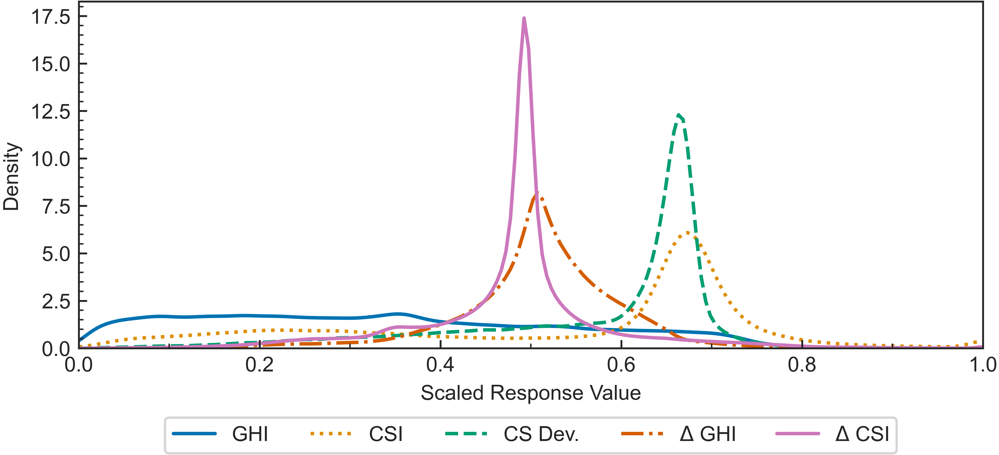

Maximum likelyhood estimation:
GHI MLE: 0.35175879396984927
CSI MLE: 0.6733668341708543
CS Dev MLE: 0.6633165829145728
Delta GHI MLE: 0.507537688442211
Delta CSI MLE: 0.49246231155778897

Mean:
GHI: Mean: 0.33558447076573367 
CSI GHI: Mean: 0.5376323771738226 
Clear Sky Deviation: Mean: 0.5750534577133943 
Delta GHI: Mean: 0.508906803438433 
Delta CSI GHI: Mean: 0.4809956056825199 

Variance:
GHI: Mean: 0.04088387484209928 
CSI GHI: Mean: 0.04993011715889306 
Clear Sky Deviation: Mean: 0.020099207081532056 
Delta GHI: Mean: 0.008187643791306614 
Delta CSI GHI: Mean: 0.010890769337537505 

Standard Deviation:
GHI: Mean: 0.20219761334422146 
CSI GHI: Mean: 0.2234504803281771 
Clear Sky Deviation: Mean: 0.14177167235217358 
Delta GHI: Mean: 0.09048559991129314 
Delta CSI GHI: Mean: 0.10435884887031624 

Skewness:
GHI: Test Statistic: 122.98721882303475 P-value: 0.0
CSI GHI: Test Statistic: -242.4442143272507 P-value: 0.0
Clear Sky Deviation: Test Statistic: -441.478211766777 P-value: 0.0


In [77]:
if 1:
    # get actual data
    with h5py.File(os.path.join("data", "windows_cache.h5"), "r") as f:
        g = f["1"]
        cs_index_ = g["clear_sky_indexes"][:]  # (N windows, n steps in + n steps out)
        cs_irradiance_ = g["clear_sky_irradiances"][
            :
        ]  # (N windows, n steps in + n steps out)
        datetimes_ = g["datetimes"][:]  # (N windows, n steps in + n steps out)
        future_features_ = g["future_features"][
            :
        ]  # (N windows, n steps out, [constants.future_features])
        past_features_ = g["past_features"][
            :
        ]  # (N windows, n steps in, [constants.past_features])
        relative_responses_ = g["relative_responses"][
            :
        ]  # (N windows, n steps out, [Delta GHI, Delta CSI GHI])
        scalar_responses_ = g["scalar_responses"][
            :
        ]  # (N windows, n steps out , [GHI, CSI GHI, cs_dev t ghi])

    responses = {
        "GHI": scalar_responses_[:, :, 0].flatten(),
        "CSI GHI": scalar_responses_[:, :, 1].flatten(),
        "Clear Sky Deviation": scalar_responses_[:, :, 2].flatten(),
        "Delta GHI": relative_responses_[:, :, 0].flatten(),
        "Delta CSI GHI": relative_responses_[:, :, 1].flatten(),
    }
    # responses_df = pd.DataFrame(responses, index=datetimes_)
    responses_df = pd.DataFrame(responses)

    scaler = MinMaxScaler()
    scaled_responses_df = pd.DataFrame(
        scaler.fit_transform(responses_df), columns=responses_df.columns
    )

    fig, ax = plt.subplots(figsize=(7, 3), dpi=1000)

    a = sns.kdeplot(
        scaled_responses_df["GHI"],
        linestyle="-",
        clip=(0, 1),
        fill=False,
        ax=ax,
        label="GHI",
    )
    a_mle = a.get_lines()[0].get_xdata()[np.argmax(a.get_lines()[0].get_ydata())]
    b = sns.kdeplot(
        scaled_responses_df["CSI GHI"],
        linestyle=":",
        clip=(0, 1),
        fill=False,
        ax=ax,
        label="CSI",
    )
    b_mle = b.get_lines()[1].get_xdata()[np.argmax(b.get_lines()[1].get_ydata())]
    c = sns.kdeplot(
        scaled_responses_df["Clear Sky Deviation"],
        linestyle="--",
        clip=(0, 1),
        fill=False,
        ax=ax,
        label=r"CS Dev.",
    )
    c_mle = c.get_lines()[2].get_xdata()[np.argmax(c.get_lines()[2].get_ydata())]
    d = sns.kdeplot(
        scaled_responses_df["Delta GHI"],
        linestyle="-.",
        clip=(0, 1),
        fill=False,
        ax=ax,
        label=r"$\Delta$ GHI",
    )
    d_mle = d.get_lines()[3].get_xdata()[np.argmax(d.get_lines()[3].get_ydata())]
    e = sns.kdeplot(
        scaled_responses_df["Delta CSI GHI"],
        linestyle="-",
        clip=(0, 1),
        fill=False,
        ax=ax,
        label=r"$\Delta$ CSI",
    )
    e_mle = e.get_lines()[4].get_xdata()[np.argmax(e.get_lines()[4].get_ydata())]

    ax.set_xlabel("Scaled Response Value")
    ax.set_ylabel("Density")
    ax.set_xlim(0, 1)
    ax.set_xticks(np.arange(0, 1.2, 0.2))
    ax.set_xticks(np.arange(0.1, 1.1, 0.2), minor=True)
    ax.yaxis.set_minor_locator(ticker.AutoMinorLocator())
    # ax.grid(True)

    # set legend at bottom
    box = ax.get_position()
    ax.set_position([box.x0, box.y0 + box.height * 0.1, box.width, box.height * 0.9])

    # Put a legend below current axis
    ax.legend(
        loc="upper center",
        bbox_to_anchor=(0.5, -0.17),
        # fancybox=True, shadow=True,
        ncol=5,
    )

    ax.add_artist(common_params.TickRedrawer())

    # eps_path = os.path.join(fig_dir, "target_distribution_kde.eps")
    pdf_path = os.path.join(fig_dir, "target_distribution_kde.pdf")

    # fig.savefig(eps_path, bbox_inches="tight")
    fig.savefig(pdf_path, bbox_inches="tight")

    plt.show()

    # stats
    print("Maximum likelyhood estimation:")
    print(f"GHI MLE: {a_mle}")
    print(f"CSI MLE: {b_mle}")
    print(f"CS Dev MLE: {c_mle}")
    print(f"Delta GHI MLE: {d_mle}")
    print(f"Delta CSI MLE: {e_mle}")

    print("\nMean:")
    for column_name in scaled_responses_df.columns:
        mean = np.mean(scaled_responses_df[column_name])
        print(f"{column_name}: Mean: {mean} ")

    print("\nVariance:")
    for column_name in scaled_responses_df.columns:
        var = np.var(scaled_responses_df[column_name])
        print(f"{column_name}: Mean: {var} ")

    print("\nStandard Deviation:")
    for column_name in scaled_responses_df.columns:
        var = np.std(scaled_responses_df[column_name])
        print(f"{column_name}: Mean: {var} ")

    print("\nSkewness:")
    for column_name in scaled_responses_df.columns:
        statistic_val, p_val = stats.skewtest(scaled_responses_df[column_name])
        print(f"{column_name}: Test Statistic: {statistic_val} P-value: {p_val}")

    print("\nKurtosis:")
    for column_name in scaled_responses_df.columns:
        statistic_val, p_val = stats.kurtosistest(scaled_responses_df[column_name])
        print(f"{column_name}: Test Statistic: {statistic_val} P-value: {p_val}")

    print("\nShapiro-Wilk Normal Test:")
    for column_name in scaled_responses_df.columns:
        statistic_val, p_val = stats.normaltest(scaled_responses_df[column_name])
        print(f"{column_name}: Test Statistic: {statistic_val} P-value: {p_val}")

cumulative distribution


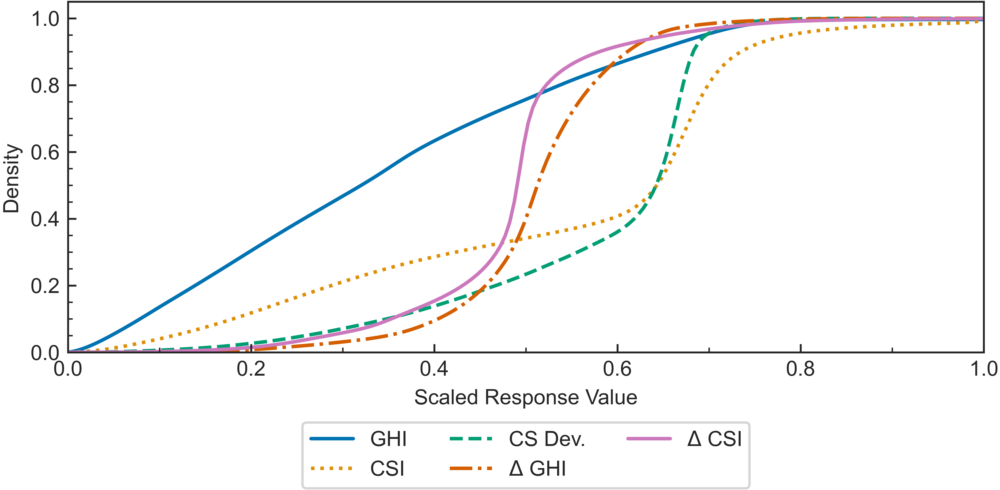

In [74]:
if 1:
    fig, ax = plt.subplots(figsize=(7, 3), dpi=1000)

    a = sns.kdeplot(
        scaled_responses_df["GHI"],
        linestyle="-",
        clip=(0, 1),
        fill=False,
        ax=ax,
        label="GHI",
        cumulative=True,
    )
    b = sns.kdeplot(
        scaled_responses_df["CSI GHI"],
        linestyle=":",
        clip=(0, 1),
        fill=False,
        ax=ax,
        label="CSI",
        cumulative=True,
    )
    c = sns.kdeplot(
        scaled_responses_df["Clear Sky Deviation"],
        linestyle="--",
        clip=(0, 1),
        fill=False,
        ax=ax,
        label=r"CS Dev.",
        cumulative=True,
    )
    d = sns.kdeplot(
        scaled_responses_df["Delta GHI"],
        linestyle="-.",
        clip=(0, 1),
        fill=False,
        ax=ax,
        label=r"$\Delta$ GHI",
        cumulative=True,
    )
    e = sns.kdeplot(
        scaled_responses_df["Delta CSI GHI"],
        linestyle="-",
        clip=(0, 1),
        fill=False,
        ax=ax,
        label=r"$\Delta$ CSI",
        cumulative=True,
    )
    ax.set_xlabel("Scaled Response Value")
    ax.set_ylabel("Density")
    ax.set_xlim(0, 1)
    ax.set_xticks(np.arange(0, 1.2, 0.2))
    ax.set_xticks(np.arange(0.1, 1.1, 0.2), minor=True)
    ax.yaxis.set_minor_locator(ticker.AutoMinorLocator())
    # ax.grid(True)

    # set legend at bottom
    box = ax.get_position()
    ax.set_position([box.x0, box.y0 + box.height * 0.1, box.width, box.height * 0.9])

    # Put a legend below current axis
    ax.legend(
        loc="upper center",
        bbox_to_anchor=(0.5, -0.17),
        # fancybox=True, shadow=True,
        ncol=3,
    )

    ax.add_artist(common_params.TickRedrawer())

    # eps_path = os.path.join(fig_dir, "target_distribution_kde.eps")
    pdf_path = os.path.join(fig_dir, "cumulative_target_distribution_kde.pdf")

    # fig.savefig(eps_path, bbox_inches="tight")
    fig.savefig(pdf_path, bbox_inches="tight")

### Autocorrelation


In [6]:
if 1:
    # get actual data
    with h5py.File(os.path.join("data", "windows_cache.h5"), "r") as f:
        g = f["13"]
        cs_index_ = g["clear_sky_indexes"][:]  # (N windows, n steps in + n steps out)
        cs_irradiance_ = g["clear_sky_irradiances"][
            :
        ]  # (N windows, n steps in + n steps out)
        datetimes_ = g["datetimes"][:]  # (N windows, n steps in + n steps out)
        future_features_ = g["future_features"][
            :
        ]  # (N windows, n steps out, [constants.future_features])
        past_features_ = g["past_features"][
            :
        ]  # (N windows, n steps in, [constants.past_features])
        relative_responses_ = g["relative_responses"][
            :
        ]  # (N windows, n steps out, [Delta GHI, Delta CSI GHI])
        scalar_responses_ = g["scalar_responses"][
            :
        ]  # (N windows, n steps out , [GHI, CSI GHI, cs_dev t ghi])
    irradiance_ = cs_index_ * cs_irradiance_
    cs_dev_ = cs_irradiance_ - irradiance_

    responses = {
        "GHI": scalar_responses_[:, :, 0],
        "CSI GHI": scalar_responses_[:, :, 1],
        "Clear Sky Deviation": scalar_responses_[:, :, 2],
        "Delta GHI": relative_responses_[:, :, 0],
        "Delta CSI GHI": relative_responses_[:, :, 1],
    }
    # Need to find prev correlation, relative responses? hw to get prev val correlation?

    columns = [f"t+{i}" for i in range(0, 26)]
    irradiance_scaler = MinMaxScaler()
    scaled_irradiance = irradiance_scaler.fit_transform(irradiance_)

    i_res = stats.spearmanr(scaled_irradiance, axis=0)
    csi_res = stats.spearmanr(cs_index_, axis=0)

    cs_dev_scaler = MinMaxScaler()
    scaled_cs_dev = irradiance_scaler.fit_transform(cs_dev_)
    cs_dev_res = stats.spearmanr(scaled_cs_dev, axis=0)

Autocorrelation bar graph


In [7]:
if 0:
    plt.rcParams["axes.axisbelow"] = False
    fig, ax = plt.subplots(figsize=(3.5, 2.7), dpi=1000)

    ax.vlines(
        x=np.arange(25) - 0.195,
        ymin=0,
        ymax=csi_res.statistic[0],
        color="tab:blue",
        label="CSI",
        zorder=1,
        linewidth=1.5,
    )
    ax.vlines(
        x=np.arange(25),
        ymin=0,
        ymax=i_res.statistic[0],
        color="tab:orange",
        label="GHI",
        zorder=2,
        linewidth=1.5,
    )
    ax.vlines(
        x=np.arange(25) + 0.195,
        ymin=0,
        ymax=cs_dev_res.statistic[0],
        color="tab:red",
        label="CS Dev",
        zorder=2,
        linewidth=1.5,
    )

    ax.hlines(y=1, xmin=-0.05, xmax=24.5, linestyles="--", linewidth=1, color="black")

    ax.set_xlim(-0.5, 24.5)
    ax.set_ylim(-0.05, 1.05)
    ax.set_xlabel("Lag")
    ax.set_ylabel("Spearman Rank Correlation Coefficient")

    ax.legend()
    # ax.grid(True)
    ax.set_axisbelow(True)
    ax.add_artist(common_params.TickRedrawer())  # This line added.
    ax.hlines(y=0, xmin=0, xmax=25, linestyles="-", linewidth=0.5, color="black")

    # fig.savefig("Reports/Images/autocorrelation_bar.png", bbox_inches="tight", dpi=1000)
    # fig.savefig("Reports/Images/autocorrelation_bar.pdf", bbox_inches="tight", dpi=1000)
    # fig.savefig("Reports/Images/autocorrelation_bar.svg", bbox_inches="tight", dpi=1000)

    plt.show()

Scatterplot Correlation


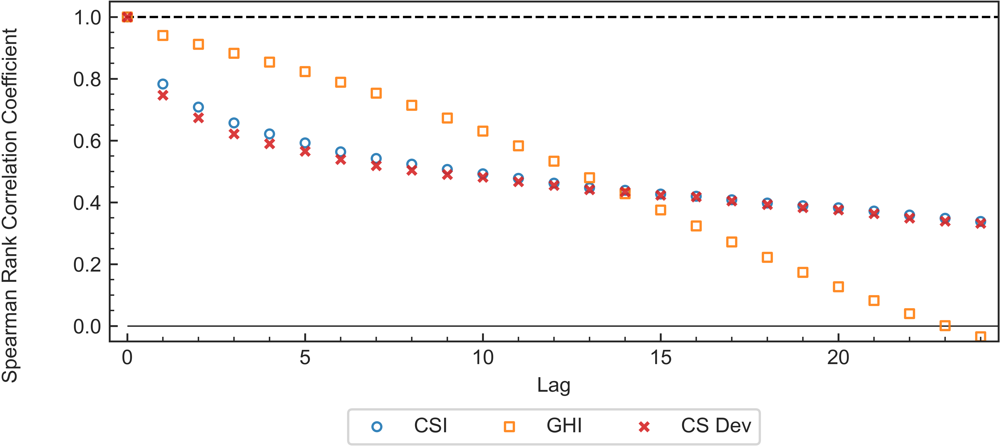

In [75]:
if 1:
    # plt.rcParams["axes.axisbelow"] = False
    fig, ax = plt.subplots(figsize=(7, 3), dpi=1000)

    ax.scatter(
        x=np.arange(25),
        y=csi_res.statistic[0],
        edgecolors="tab:blue",
        facecolors="none",
        label="CSI",
        zorder=2,
        marker="o",
        s=15,
        alpha=0.9,
    )
    ax.scatter(
        x=np.arange(25),
        y=i_res.statistic[0],
        edgecolors="tab:orange",
        facecolors="none",
        label="GHI",
        zorder=2,
        marker="s",
        s=15,
        alpha=0.9,
    )
    ax.scatter(
        x=np.arange(25),
        y=cs_dev_res.statistic[0],
        c="tab:red",
        label="CS Dev",
        zorder=2,
        marker="x",
        s=15,
        alpha=0.9,
    )

    ax.hlines(
        y=1,
        xmin=-0.05,
        xmax=24.5,
        linestyles="--",
        linewidth=1,
        zorder=1,
        color="black",
    )
    ax.hlines(
        y=0, xmin=0, xmax=25, linestyles="-", linewidth=0.5, zorder=1, color="black"
    )

    ax.set_xlim(-0.5, 24.5)
    ax.set_ylim(-0.05, 1.05)
    ax.set_xlabel("Lag")
    ax.set_ylabel("Spearman Rank Correlation Coefficient")
    ax.yaxis.set_label_coords(-0.1, 0.4)
    ax.xaxis.set_minor_locator(ticker.AutoMinorLocator())
    ax.yaxis.set_minor_locator(ticker.AutoMinorLocator())

    box = ax.get_position()
    ax.set_position([box.x0, box.y0 + box.height * 0.1, box.width, box.height * 0.9])

    # Put a legend below current axis
    ax.legend(
        loc="upper center",
        bbox_to_anchor=(0.5, -0.17),
        # fancybox=True, shadow=True,
        ncol=3,
    )

    ax.add_artist(common_params.TickRedrawer())  # This line added.

    # fig.savefig(os.path.join(fig_dir, "autocorrelation_plot.png"), bbox_inches="tight", dpi=1000)
    fig.savefig(
        os.path.join(fig_dir, "autocorrelation_plot.pdf"), bbox_inches="tight", dpi=1000
    )
    # fig.savefig(os.path.join(fig_dir, "autocorrelation_plot.svg"), bbox_inches="tight", dpi=1000)

    plt.show()

## Feature Autocorrelation

## -autocorrelation


In [13]:
from statsmodels.graphics.tsaplots import plot_acf
from statsmodels.tsa.stattools import adfuller

In [10]:
df = data_df.copy()
# reindex to 10 minute intervals from start to finish
idx = pd.date_range(df.index[0], df.index[-1], freq="10T")
df = df.reindex(idx, fill_value=np.nan)

autocorr_df = pd.DataFrame(columns=df.columns)
for i in range(26):
    autocorr_df.loc[i] = df.corrwith(df.shift(i))
autocorr_df.to_csv(os.path.join("results", "autocorr.csv"))

In [ ]:
target = "CSI GHI"

selected_features = [
    "BRBG Total Cloud Cover [%]",
    "CSI GHI",
    "dni t-4",
    "940nm POM-01 Photometer [uA]",
    "cs_dev_mean t-10 dni",
    "675nm POM-01 Photometer [uA]",
    "CSI DNI",
    "elevation",
    "cs_dev t dni",
    "dni t-9",
]

In [1]:
stats_df = pd.DataFrame()
for feature in df.columns:
    adf_results = adfuller(df[feature], maxlag=480, regression="ctt")
    lj_box_results = sm.stats.acorr_ljungbox(df[feature], lags=[480], boxpierce=True)
    lj_box_diff_results = sm.stats.acorr_ljungbox(
        df[feature].diff().dropna(), lags=[480], boxpierce=True
    )
    spearmanr_results = stats.spearmanr(df[feature], df[target])
    break

NameError: name 'pd' is not defined

In [30]:
sm.stats.acorr_ljungbox(df[feature], lags=[480], boxpierce=True)

,lb_stat,lb_pvalue,bp_stat,bp_pvalue
480,3.510102e+06,0.0,3.509299e+06,0.0


In [31]:
sm.stats.acorr_ljungbox(df[feature].diff().dropna(), lags=[480], boxpierce=True)

,lb_stat,lb_pvalue,bp_stat,bp_pvalue
480,25428.938791,0.0,25428.071019,0.0


In [33]:
stats.spearmanr(df[feature], df[target])

SignificanceResult(statistic=-0.004037217478515837, pvalue=0.03838006939302431)

In [35]:
stats.spearmanr(df[feature].diff().dropna(), df[target].diff().dropna())

SignificanceResult(statistic=0.007375263255160117, pvalue=0.0001549780468380224)

## Boruta


### Time Series Stats

Show stationarity, seasonality, residual using cs deviation


In [ ]:
trend = data_df["cs_dev t ghi"].rolling(20_160).mean()  # 20,160 = 2 weeks in minutes
st_dev_trend = data_df["cs_dev t ghi"].rolling(20_160).std()

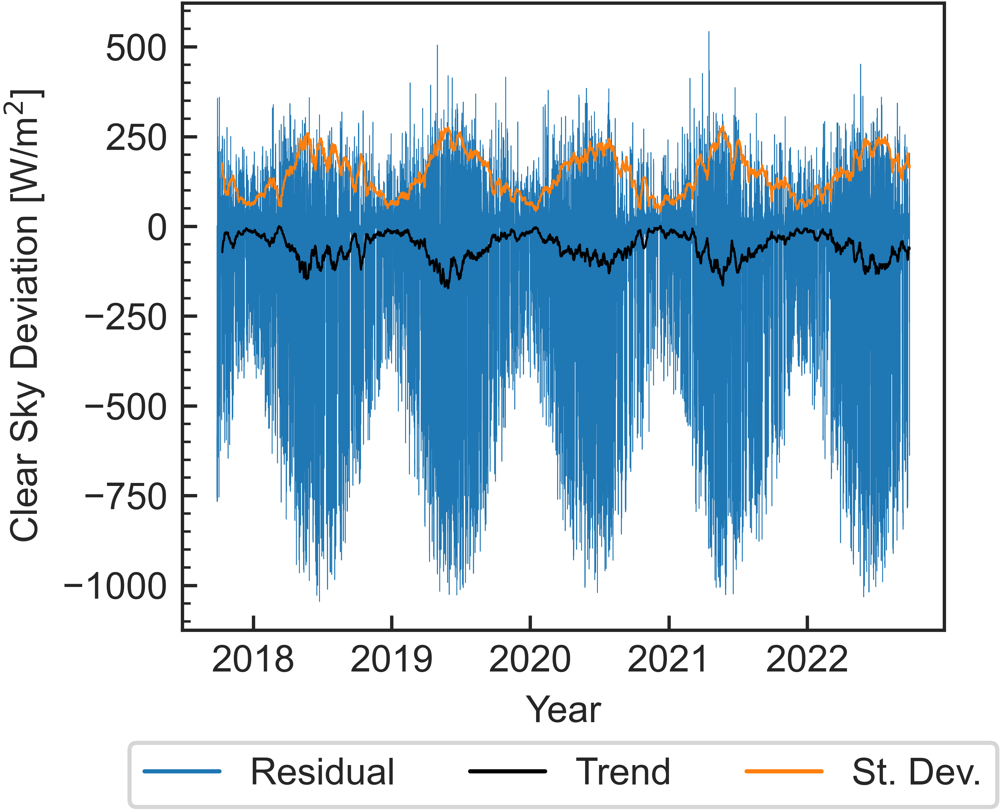

In [5]:
fig, ax = plt.subplots(1, 1, figsize=(3.5, 3), sharex=True, dpi=1000)

ax.plot(
    data_df.index,
    data_df["cs_dev t ghi"],
    color="tab:blue",
    linewidth=0.2,
    label="Residual",
)
ax.plot(trend.index, trend, color="black", linewidth=0.5, label="Trend")
ax.plot(
    st_dev_trend.index,
    st_dev_trend,
    color="tab:orange",
    linewidth=0.5,
    label="Std. Dev.",
)

ax.set_ylabel(r"Clear Sky Deviation [W/m$^2$]")
ax.set_xlabel("Year")
ax.yaxis.set_minor_locator(ticker.AutoMinorLocator())

new_leg = [
    mlines.Line2D([], [], color="tab:blue", linewidth=1.0, label="Residual"),
    mlines.Line2D([], [], color="black", linewidth=1.0, label="Trend"),
    mlines.Line2D([], [], color="tab:orange", linewidth=1.0, label="St. Dev."),
]

# Put a legend below current axis
ax.legend(handles=new_leg, loc="upper center", bbox_to_anchor=(0.5, -0.15), ncol=3)

fig.tight_layout()

fig.savefig("Reports/Images/seasonality.pdf", bbox_inches="tight", dpi=1000)

plt.show()

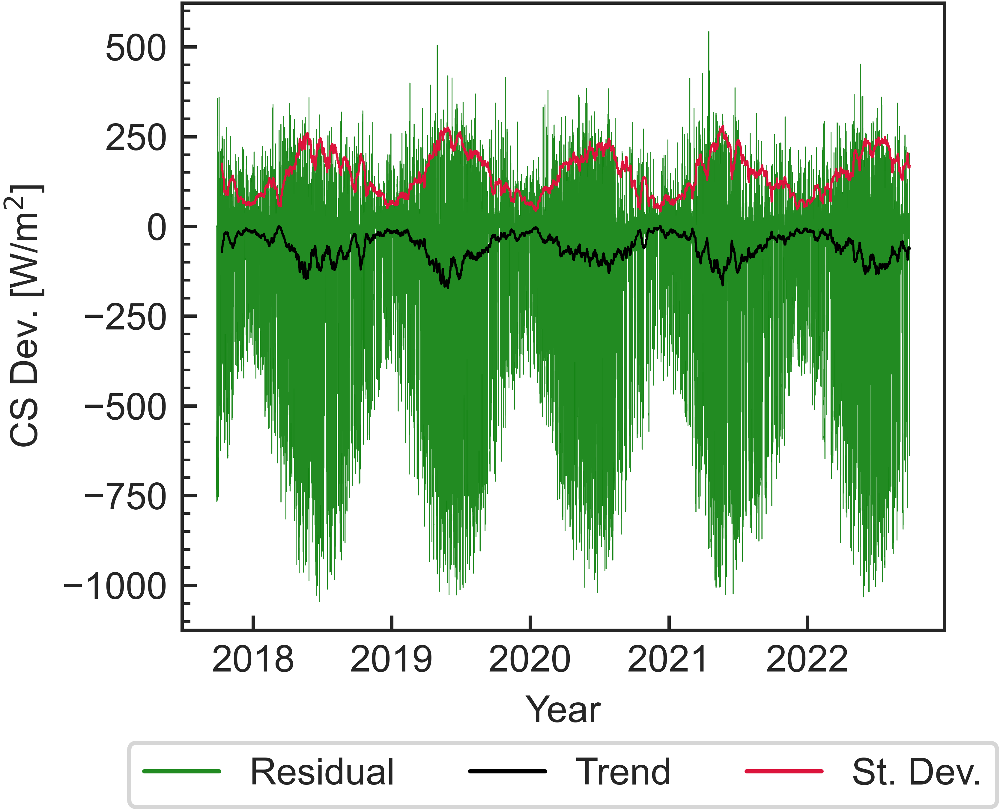

In [3]:
if 1:
    trend = (
        data_df["cs_dev t ghi"].rolling(20_160).mean()
    )  # 20,160 = 2 weeks in minutes
    st_dev_trend = data_df["cs_dev t ghi"].rolling(20_160).std()

    fig, ax = plt.subplots(1, 1, figsize=(3.5, 3), sharex=True, dpi=1000)
    # df.plot(subplots=True,layout=(3,1), ax=axs, legend=False, sharex=True, linewidth=0.2)
    # axs[0].plot(data_df.index, data_df["GHI"], color="royalblue", linewidth=0.2, label="Measured GHI")
    # axs[1].plot(data_df.index, data_df["clearsky ghi"], color="orangered", linewidth=0.2, label="Seasonality")
    ax.plot(
        data_df.index,
        data_df["cs_dev t ghi"],
        color="forestgreen",
        linewidth=0.2,
        label="Residual",
    )
    ax.plot(trend.index, trend, color="black", linewidth=0.5, label="Trend")
    ax.plot(
        st_dev_trend.index,
        st_dev_trend,
        color="crimson",
        linewidth=0.5,
        label="Std. Dev.",
    )
    # ax2 = ax.twinx()
    # rolling_avg_days = 30
    # # ax2.plot(data_df.index, data_df['GHI'].rolling(rolling_avg_days*144).mean(), color="orange", linewidth=0.5, label=f"{rolling_avg_days}-day mean")
    # ax2.plot(data_df.index, data_df['GHI'].rolling(rolling_avg_days*144).median(), color="orange", linewidth=0.5, label=f"{rolling_avg_days}-day median")

    # axs[0].set_xlim(data_df.index[0], data_df.index[-1])
    # axs[0].set_ylabel(r"GHI [W/m$^2$]"+"\n", labelpad=0.5)
    # axs[0].set_ylim(0, 1500)
    # axs[0].yaxis.set_minor_locator(ticker.AutoMinorLocator())
    # axs[1].set_ylabel(r"CS [W/m$^2$]"+"\n", labelpad=0.5)
    # axs[1].set_ylim(0, 1200)
    # axs[1].yaxis.set_minor_locator(ticker.AutoMinorLocator())
    ax.set_ylabel(r"CS Dev. [W/m$^2$]")
    ax.set_xlabel("Year")
    ax.yaxis.set_minor_locator(ticker.AutoMinorLocator())

    new_leg = [
        mlines.Line2D([], [], color="forestgreen", linewidth=1.0, label="Residual"),
        mlines.Line2D([], [], color="black", linewidth=1.0, label="Trend"),
        mlines.Line2D([], [], color="crimson", linewidth=1.0, label="St. Dev."),
        # mlines.Line2D([], [], color="crimson", linewidth=1.0, label="St. Dev.")
    ]

    # Put a legend below current axis
    ax.legend(
        handles=new_leg,
        loc="upper center",
        bbox_to_anchor=(0.5, -0.15),
        # fancybox=True, shadow=True,
        ncol=3,
    )

    fig.tight_layout()

    fig.savefig("Reports/Images/seasonality.pdf", bbox_inches="tight", dpi=1000)

    plt.show()

Old Graph


In [10]:
if 0:
    trend = (
        data_df["cs_dev t ghi"].rolling(20_160).mean()
    )  # 20,160 = 2 weeks in minutes
    st_dev_trend = data_df["cs_dev t ghi"].rolling(20_160).std()

    fig, axs = plt.subplots(3, 1, figsize=(3.5, 3), sharex=True, dpi=1000)
    # df.plot(subplots=True,layout=(3,1), ax=axs, legend=False, sharex=True, linewidth=0.2)
    axs[0].plot(
        data_df.index,
        data_df["GHI"],
        color="royalblue",
        linewidth=0.2,
        label="Measured GHI",
    )
    axs[1].plot(
        data_df.index,
        data_df["clearsky ghi"],
        color="orangered",
        linewidth=0.2,
        label="Seasonality",
    )
    axs[2].plot(
        data_df.index,
        data_df["cs_dev t ghi"],
        color="forestgreen",
        linewidth=0.2,
        label="Residual",
    )
    axs[2].plot(trend.index, trend, color="black", linewidth=0.5, label="Trend")
    axs[2].plot(
        st_dev_trend.index,
        st_dev_trend,
        color="crimson",
        linewidth=0.5,
        label="Std. Dev.",
    )

    axs[0].set_xlim(data_df.index[0], data_df.index[-1])
    axs[0].set_ylabel(r"GHI [W/m$^2$]" + "\n", labelpad=0.5)
    axs[0].set_ylim(0, 1500)
    axs[0].yaxis.set_minor_locator(ticker.AutoMinorLocator())
    axs[1].set_ylabel(r"CS [W/m$^2$]" + "\n", labelpad=0.5)
    axs[1].set_ylim(0, 1200)
    axs[1].yaxis.set_minor_locator(ticker.AutoMinorLocator())
    axs[2].set_ylabel(r"CS Dev. [W/m$^2$]")
    axs[2].set_xlabel("Year")
    axs[2].yaxis.set_minor_locator(ticker.AutoMinorLocator())

    new_leg = [
        mlines.Line2D([], [], color="forestgreen", linewidth=1.0, label="Residual"),
        mlines.Line2D([], [], color="black", linewidth=1.0, label="Trend"),
        mlines.Line2D([], [], color="crimson", linewidth=1.0, label="St. Dev."),
    ]

    fig.subplots_adjust(hspace=0.05)

    ax = axs[-1]

    # Put a legend below current axis
    ax.legend(
        handles=new_leg,
        loc="upper center",
        bbox_to_anchor=(0.5, -0.5),
        # fancybox=True, shadow=True,
        ncol=3,
    )

    fig.tight_layout()

    # # fig.savefig("Reports/Images/seasonality.png", bbox_inches="tight", dpi=1000)
    fig.savefig("Reports/Images/seasonality.pdf", bbox_inches="tight", dpi=1000)
    # # fig.savefig("Reports/Images/seasonality.svg", bbox_inches="tight", dpi=1000)

    # plt.show()

## Missing Data


Visualize missing data points

Data quality and maintenance records available at https://midcdmz.nrel.gov/apps/html.pl?site=SRRLASI;page=instruments#ASI  
**A** Corresponds to R#3 on the Data quality statement and a firmware issue on 10-20% of the images  
**B** Corresponds to a firmware issue noted by researcher Afshin Andreas (personal correspondence)  
**C** Corresponds to R#7 on the DQS: "software tends to ignore all images at 0:00 GMT (17:00 MST) and occasional a few other chucks of random time stamps. These images will be missing from MIDC due to this bug."


In [11]:
if 0:
    # fig, ax = plt.subplots(figsize=(12, 5))
    fig, ax = plt.subplots(figsize=(3.5, 2.5), dpi=1000)

    x_true = ideal_series.index.date[ideal_series["Error Data Point"] == True]
    y_true = (
        ideal_series.index.hour[ideal_series["Error Data Point"] == True]
        + ideal_series.index.minute[ideal_series["Error Data Point"] == True] / 60
    )

    synthetic_year_d = {}
    for i, d in enumerate(dates):
        if d.year == 2019:
            synthetic_year_d[d.strftime("%j")] = [min_true[i], max_true[i]]

    synthetic_min_true = [
        synthetic_year_d.get(d.strftime("%j"), [7.5, 16.1])[0] for d in dates
    ]
    synthetic_max_true = [
        synthetic_year_d.get(d.strftime("%j"), [7.5, 16.1])[1] for d in dates
    ]

    plt.fill_between(
        dates,
        synthetic_min_true,
        synthetic_max_true,
        color="lightgray",
        label="Valid Data Range",
    )
    plt.scatter(
        x_true,
        y_true,
        marker="o",
        color="black",
        edgecolors="none",
        s=1,
        label="Missing Data",
    )

    plt.xlabel("Date", size="large")
    plt.ylabel("Time of Day (Hour)", size="large")

    ax.set_yticks(np.arange(4, 22, 2))

    plt.text(date(2019, 3, 15), 19.5, "A")
    plt.text(date(2022, 8, 15), 19, "B")

    firmware_1500_year = 2017
    firmware_1500_month = 12

    plt.text(date(firmware_1500_year, firmware_1500_month, 10), 17.5, "C")
    plt.text(date(firmware_1500_year + 1, firmware_1500_month, 10), 17.5, "C")
    plt.text(date(firmware_1500_year + 2, firmware_1500_month, 10), 17.5, "C")
    plt.text(date(firmware_1500_year + 3, firmware_1500_month, 10), 17.5, "C")
    plt.text(date(firmware_1500_year + 4, firmware_1500_month, 10), 17.5, "C")

    plt.ylim(4, 20.5)

    ax.legend(
        loc="upper center",
        bbox_to_anchor=(0.5, -0.2),
        # fancybox=True, shadow=True,
        ncol=2,
    )
    # fig.savefig("Reports/Images/missing_data.eps", bbox_inches="tight")
    fig.savefig("Reports/Images/missing_data.pdf", bbox_inches="tight")
    # plt.grid(alpha=0.3)
    plt.show()

### Graph a Typical Day

Requires relative paths on HAMRAM to get NREL iamges


In [12]:
if 0:
    selected_date = datetime.date(2022, 5, 18)
    selected_time = datetime.time(10, 0)
    my_datetime = pd.to_datetime(
        datetime.datetime.combine(selected_date, selected_time)
    ).tz_localize("MST")

    df_selection = data_df[data_df.index.date == selected_date].dropna()

    df = df_selection.copy()
    current_time_df = df[df.index == my_datetime]
    before_df = df[df.index < my_datetime]
    input_cutoff = my_datetime - datetime.timedelta(hours=5)
    input_df = before_df[before_df.index >= input_cutoff]
    after_current_time = df[df.index > my_datetime]
    prediction_cutoff = my_datetime + datetime.timedelta(hours=2)
    prediction_df = after_current_time[after_current_time.index <= prediction_cutoff]

    images_dir = os.path.join(
        "B:", "projects", "stellar", "data", "NREL", my_datetime.strftime("%Y%m%d")
    )
    image_times = [
        datetime.time(5, 0),
        datetime.time(7, 0),
        datetime.time(9, 0),
        datetime.time(11, 0),
        datetime.time(13, 0),
        datetime.time(15, 0),
        datetime.time(17, 10),
        datetime.time(19, 0),
    ]
    image_paths = [
        os.path.join(
            images_dir,
            datetime.datetime.combine(selected_date, t).strftime("%Y%m%d%H%M%S")
            + "_Raw_NE.jpg",
        )
        for t in image_times
    ]

    fig = plt.figure(figsize=(7, 4), dpi=1000)
    grid_rows = 8
    grid_cols = 8
    image_rows = 2
    gridspec = fig.add_gridspec(grid_rows, grid_cols)
    image_row_start = grid_rows - image_rows
    ax = fig.add_subplot(gridspec[0:-image_rows, :])
    ax_img0 = fig.add_subplot(gridspec[image_row_start:, 0])
    ax_img1 = fig.add_subplot(gridspec[image_row_start:, 1])
    ax_img2 = fig.add_subplot(gridspec[image_row_start:, 2])
    ax_img3 = fig.add_subplot(gridspec[image_row_start:, 3])
    ax_img4 = fig.add_subplot(gridspec[image_row_start:, 4])
    ax_img5 = fig.add_subplot(gridspec[image_row_start:, 5])
    ax_img6 = fig.add_subplot(gridspec[image_row_start:, 6])
    ax_img7 = fig.add_subplot(gridspec[image_row_start:, 7])

    image_axes = [
        ax_img0,
        ax_img1,
        ax_img2,
        ax_img3,
        ax_img4,
        ax_img5,
        ax_img6,
        ax_img7,
    ]

    # ax.set_title(f"Irradiance Measured at NREL on {my_datetime.strftime('%B %d, %Y')}", loc="center")

    # a = sns.scatterplot(data=df, x=df.index, y="GHI", color="orange", marker='X', label="Measured Irradiance", ax=ax)
    # b = sns.lineplot(data=df, x=df.index, y="clearsky ghi", color="red",marker='o', label="Clear Sky Irradiance".title(), ax=ax)
    a = ax.scatter(
        df.index, df["GHI"], color="black", marker="o", s=1, label="Measured Irradiance"
    )
    b = ax.plot(
        df.index, df["clearsky ghi"], color="red", label="Clear Sky Irradiance".title()
    )
    # ax2 = ax.twinx()
    # # sns.lineplot(data=df, x=df.index.time, y="CDOC Total Cloud Cover [%]",marker='o', color="gray", alpha=0.5, label="Cloud Cover", ax=ax2)
    # c = sns.lineplot(data=df, x=df.index, y=df["CSI GHI"]*100, color="blue",marker='o', alpha=0.7, label="clear sky index".title(), ax=ax2)

    ax.set_ylabel(r"GHI (W/m$^2$)")
    # ax2.set_ylabel(r"Clear Sky Index (%)")
    # ax2.set_ylim(0, 155)

    ax.xaxis.set_major_formatter(DateFormatter("%H:%M", tz=df.index.tz))
    ax.xaxis.set_major_locator(md.HourLocator(byhour=range(5, 21, 2), tz=df.index.tz))

    # ax.grid()
    # h1,l1 = ax.get_legend_handles_labels()
    # h2,l2 = ax2.get_legend_handles_labels()
    # ax2.legend(h1+h2,l1+l2, framealpha=1, loc="upper right")
    # ax.get_legend().remove()
    ax.legend()
    ax.set_xlabel(None)
    ax.set_xlim(
        df.index.min() - datetime.timedelta(minutes=40),
        df.index.max() + datetime.timedelta(minutes=30),
    )
    # x_ticks = ax.get_xticks()
    # ax.set_xticklabels(["" for i in x_ticks])

    # images
    image_titles = "ABCDEFGHIJ"
    for i, img_ax in enumerate(image_axes):
        img = plt.imread(image_paths[i])
        img_ax.imshow(img)
        img_ax.axis("off")
        img_ax.set_title(image_titles[i], size="x-small")
    # fig.tight_layout()
    fig.text(0.5, 0.265, "Time of Day", ha="center", va="center")
    fig.subplots_adjust(wspace=0.15, hspace=1.7)
    # fig.savefig(os.path.join(fig_dir, "example_day.png"), bbox_inches="tight")
    # fig.savefig(os.path.join(fig_dir, "example_day.svg"), bbox_inches="tight")
    fig.savefig(os.path.join(fig_dir, "example_day.pdf"), bbox_inches="tight")
    # fig.savefig(os.path.join(fig_dir, "example_day.jpg"), bbox_inches="tight")
    plt.show()

## Results Analysis


## Experiment 1: Future Irradiance and Time representations

SOL-90 through SOL-161


/var/folders/s5/91gspn4x2j9c_j33qvjvrlt00000gn/T/ipykernel_45068/134052984.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  cv1_runs.loc[:, "Time Representation"] = cv1_runs["selected groups"].apply(
/var/folders/s5/91gspn4x2j9c_j33qvjvrlt00000gn/T/ipykernel_45068/134052984.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  cv1_runs.loc[:, "pivot rows"] = cv1_runs["Time Representation"].apply(
/var/folders/s5/91gspn4x2j9c_j33qvjvrlt00000gn/T/ipykernel_45068/134052984.py:24: SettingWithCopyWarning: 
A v

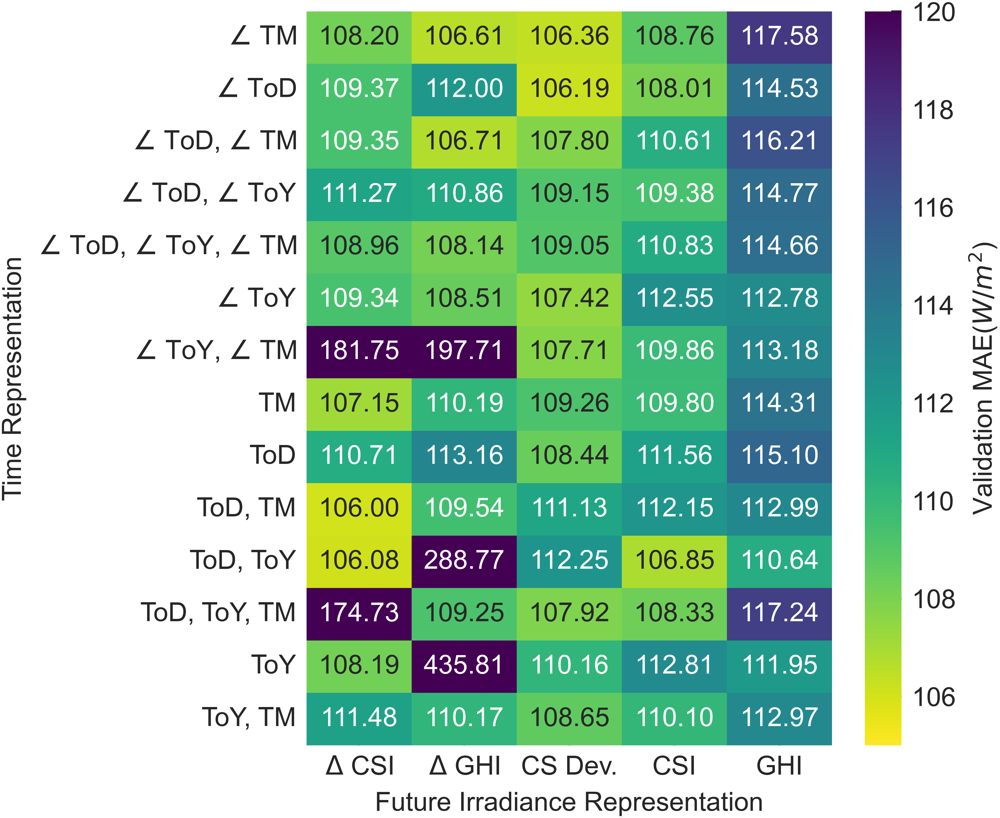

In [76]:
if 1:
    cv1_runs = runs_table_df[
        runs_table_df["sys/id"].isin([f"SOL-{i}" for i in range(90, 161)])
    ]

    cv1_runs.loc[:, "selected groups"] = cv1_runs["selected groups"].apply(
        lambda x: eval(x)
    )
    cv1_runs.loc[:, "Time Representation"] = cv1_runs["selected groups"].apply(
        lambda x: [i for i in x if "Time" in i]
    )

    # abbreviate time representations
    cv1_runs.loc[:, "Time Representation"] = cv1_runs["Time Representation"].apply(
        lambda x: [
            constants.TIME_REPRESENTATION_ABBREVIATIONS.get(i, "ERROR") for i in x
        ]
    )
    # cv1_runs[["selected groups", "Time Representation", "CV 1: Validate MAE"]].head()

    cv1_runs.loc[:, "pivot rows"] = cv1_runs["Time Representation"].apply(
        lambda x: ", ".join(i for i in x)
    )
    cv1_runs.loc[:, "responses intermediate"] = cv1_runs["selected responses"].apply(
        lambda x: constants.RESPONSE_FULL_NAMES.get(eval(x)[0], "ERROR")
    )
    cv1_runs.loc[:, "pivot columns"] = cv1_runs["responses intermediate"].apply(
        lambda x: constants.TARGET_REPRESENTATION_ABBREVIATIONS.get(x, "ERROR")
    )

    a = constants.TARGET_REPRESENTATION_ABBREVIATIONS.get("Change in Irradiance")

    pivot_df = cv1_runs.pivot_table(
        index="pivot rows",
        columns="pivot columns",
        values="CV 1: Validate MAE",
        aggfunc="mean",
    )

    pivot_df.columns.name = "Future Irradiance Representation"
    pivot_df.index.name = "Time Representation"

    fig, ax = plt.subplots(figsize=(4, 4.5), dpi=1000)
    sns.heatmap(
        pivot_df,
        annot=True,
        fmt=".2f",
        vmax=120,
        vmin=105,
        cmap="viridis_r",
        cbar_kws={"label": r"Validation MAE($W/m^2$)"},
    )
    # fig.savefig(os.path.join(fig_dir, "cv1_pivot_table.png"), dpi=1000, bbox_inches='tight')
    # fig.savefig(os.path.join(fig_dir, "cv1_pivot_table.svg"), dpi=1000, bbox_inches='tight')
    # fig.savefig(os.path.join(fig_dir, "cv1_pivot_table.eps"), dpi=1000, bbox_inches='tight')
    fig.savefig(
        os.path.join(fig_dir, "cv1_pivot_table.pdf"), dpi=1000, bbox_inches="tight"
    )
    plt.show()

    pivot_df.columns.name = None
    pivot_df.index.name = None

    # pivot_df.to_latex("./Reports/Tables/Experiment1.tex",
    #     longtable=False,
    #     float_format="%.2f",
    #     bold_rows=True,
    #     escape=False,
    #     label="tab:experiment1",
    #     caption="Mean Absolute Error for Experiment 1. Each row represents a different way of representing time and each column represents the a different representation of future irradiance")

    # pivot_df.to_csv("./Reports/Tables/Experiment1.csv")

## Experiment 2: Input Time Length

SOL-173 though SOL-208 due to some errors


In [103]:
if 1:
    CV2_steps_in = {
        "SOL-173": 1,
        "SOL-174": 2,
        "SOL-175": 3,
        "SOL-176": 4,
        "SOL-177": 5,
        "SOL-178": 6,
        "SOL-208": 7,
        "SOL-197": 8,
        "SOL-198": 9,
        "SOL-199": 10,
        "SOL-200": 11,
        "SOL-180": 13,
        "SOL-181": 12,
    }

    cv2_runs_df = runs_table_df[
        runs_table_df["sys/id"].isin(CV2_steps_in.keys())
    ]  # 179 ommited because it did not converge

    cv2_runs_df["Steps in"] = cv2_runs_df["sys/id"].map(CV2_steps_in)
    
    cv2_runs_df.sort_values(by="Steps in", inplace=True)

    # steps_in = cv2_runs_df["Steps in"].values
    # cv2_train_mae = cv2_runs_df["CV 1: Train MAE"].values
    # cv2_validate_mae = cv2_runs_df["CV 1: Validate MAE"].values

    # input_horizon = (steps_in - 1) * 10

    # fig, ax = plt.subplots(figsize=(3.5, 2.5), dpi=1000)
    # # ax.plot(steps_in, cv2_train_mae, "rX", alpha=0.7, label="Train")
    # ax.plot(input_horizon, cv2_validate_mae, "bo", alpha=0.7, label="Validation")

    # ax.set_ylim(75, 90)

    # ax.set_ylabel(r"Model Mean Absolute Error ($W/m^2$)")
    # ax.set_xlabel("Input Temporal Horizon (Minutes)")
    # ax.set_xticks(np.arange(0, 130, 10))
    # # ax.legend()
    # # ax.grid()
    # # fig.savefig("Reports/Images/CV2_time_steps.png", dpi=1000, bbox_inches="tight")
    # # fig.savefig("Reports/Images/CV2_time_steps.eps", dpi=1000, bbox_inches="tight")
    # # fig.savefig("Reports/Images/CV2_time_steps.svg", dpi=1000, bbox_inches="tight")
    # fig.savefig("Figures/CV2_time_steps.pdf", dpi=1000, bbox_inches="tight")
    # plt.show()

    experiment2_table = cv2_runs_df[
        ["Steps in", "CV 1: Train MAE", "CV 1: Validate MAE", ]
    ]
    experiment2_table.sort_values(by="Steps in", inplace=True)
    # rename columns
    experiment2_table.rename(
        columns={
            "Steps in": "Input Sequence Length",
            "CV 1: Train MAE": r"Train MAE (W/m$^2$)",
            "CV 1: Validate MAE": r"Validation MAE (W/m$^2$)",
        },
        inplace=True,
    )

/var/folders/s5/91gspn4x2j9c_j33qvjvrlt00000gn/T/ipykernel_45068/2869433798.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  cv2_runs_df["Steps in"] = cv2_runs_df["sys/id"].map(CV2_steps_in)
/var/folders/s5/91gspn4x2j9c_j33qvjvrlt00000gn/T/ipykernel_45068/2869433798.py:24: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  cv2_runs_df.sort_values(by="Steps in", inplace=True)
/var/folders/s5/91gspn4x2j9c_j33qvjvrlt00000gn/T/ipykernel_45068/2869433798.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats i

In [111]:
experiment2_table.to_latex(os.path.join("Experiment2.tex"),float_format="%.2f")

In [48]:
mae_time = ["CV 1: Validate MAE t+10 min", "CV 1: Validate MAE t+20 min", "CV 1: Validate MAE t+30 min",
    "CV 1: Validate MAE t+40 min", "CV 1: Validate MAE t+50 min", "CV 1: Validate MAE t+60 min",
    "CV 1: Validate MAE t+70 min", "CV 1: Validate MAE t+80 min", "CV 1: Validate MAE t+90 min",
    "CV 1: Validate MAE t+100 min", "CV 1: Validate MAE t+110 min", "CV 1: Validate MAE t+120 min",]

# cv2_df = cv2_runs_df[["Steps in", "CV 1: Validate MAE"] + mae_time]
cv2_df = cv2_runs_df[["Steps in"] + mae_time]


cv2_df.sort_values(by="Steps in", inplace=True)

cv2 = pd.melt(cv2_df, id_vars="Steps in", var_name="Time Ahead", value_name="MAE")
cv2["Time Ahead"] = cv2["Time Ahead"].apply(lambda x: int(x.split(" ")[-2][2:]))


/var/folders/s5/91gspn4x2j9c_j33qvjvrlt00000gn/T/ipykernel_45068/479475241.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  cv2_df.sort_values(by="Steps in", inplace=True)


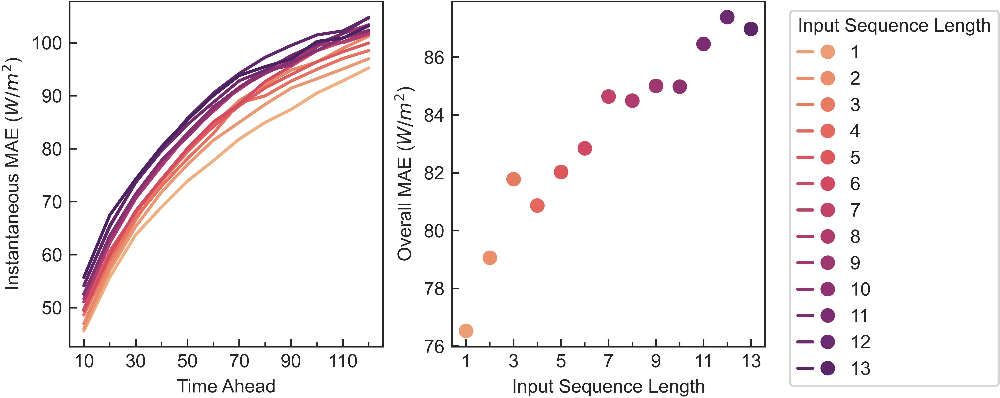

In [109]:
from matplotlib.legend_handler import HandlerTuple

fig, ax = plt.subplots(1, 2, figsize=(6, 3), dpi=1000)

sns.lineplot(cv2, x="Time Ahead", y="MAE", hue="Steps in", palette="flare", ax=ax[0], legend=None)
ax[0].set_ylabel("Instantaneous MAE ($W/m^2$)")
ax[0].set_xticks(np.arange(10, 130, 10), minor=True)
ax[0].set_xticks(np.arange(10, 130, 20))
# ax[0].legend(None)

c = sns.color_palette("flare", n_colors=13)
ax[1].scatter(cv2_runs_df["Steps in"], cv2_runs_df["CV 1: Validate MAE"], color=c)
ax[1].set_ylabel("Overall MAE ($W/m^2$)")
ax[1].set_xlabel("Input Sequence Length")
ax[1].set_xticks(np.arange(1, 14, 1), minor=True)
ax[1].set_xticks(np.arange(1, 14, 2))

legend_items = []
legend_labels = np.arange(1, 14, 1)
for i in c:
    line = plt.plot([], [], color=i, linestyle="-")[0]
    dot = plt.plot([], [], color=i, linestyle="none", marker="o")[0]
    legend_items.append((line, dot))

ax[1].legend(legend_items, legend_labels, handler_map={tuple: HandlerTuple(ndivide=None)},
    title="Input Sequence Length", bbox_to_anchor=(1.05, 1), loc='upper left',
    alignment='left')

fig.subplots_adjust(wspace=0.22)
fig.savefig(os.path.join(fig_dir, "cv2_time_steps_dual.pdf"), dpi=1000, bbox_inches="tight")

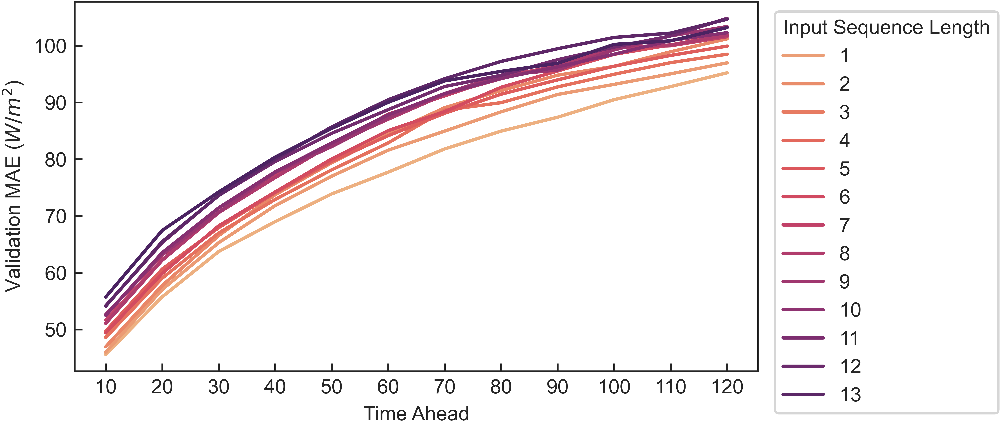

In [110]:
fig, ax = plt.subplots(1, 1, figsize=(5.5, 3), dpi=1000)
ax = [ax]

sns.lineplot(cv2, x="Time Ahead", y="MAE", hue="Steps in", palette="flare", ax=ax[0], legend=None)
ax[0].set_ylabel("Validation MAE ($W/m^2$)")
ax[0].set_xticks(np.arange(10, 130, 10))
# ax[0].set_xticks(np.arange(10, 130, 20))
# ax[0].legend(None)

# c = sns.color_palette("flare", n_colors=13)
# ax[1].scatter(cv2_runs_df["Steps in"], cv2_runs_df["CV 1: Validate MAE"], color=c)
# ax[1].set_ylabel("Overall MAE ($W/m^2$)")
# ax[1].set_xlabel("Input Sequence Length")
# ax[1].set_xticks(np.arange(1, 14, 1), minor=True)
# ax[1].set_xticks(np.arange(1, 14, 2))

legend_items = []
legend_labels = np.arange(1, 14, 1)
for i in c:
    line = plt.plot([], [], color=i, linestyle="-")[0]
    # dot = plt.plot([], [], color=i, linestyle="none", marker="o")[0]
    legend_items.append((line))

ax[0].legend(legend_items, legend_labels, handler_map={tuple: HandlerTuple(ndivide=None)},
    title="Input Sequence Length", bbox_to_anchor=(1.01, 1), loc='upper left',
    alignment='left')

fig.subplots_adjust(wspace=0.22)
fig.savefig(os.path.join(fig_dir, "cv2_time_steps.pdf"), dpi=1000, bbox_inches="tight")

## Experiment 3: Feature Importance


In [15]:
if 0:
    target_var = "Delta CSI GHI"  # {cs_dev, CSI GHI, Delta CSI GHI, Delta GHI, GHI}
    filename = f"feature_importance_{target_var}_CV3_iteration1.csv"
    feature_impostance_results_path = os.path.join(
        "results", "feature_importance", filename
    )
    df = pd.read_csv(feature_impostance_results_path)
    df.rename(columns={"Unnamed: 0": "feature"}, inplace=True)

    fig, ax = plt.subplots(figsize=(3.5, 2.5), dpi=1000)
    df.hist(bins=np.arange(-1, 39, 1), ax=ax, edgecolor="black")
    ax.set_xlabel(r"Feature Importance ($\Delta$ MAE)")
    ax.set_ylabel("Count of Features")
    ax.set_yticks(np.arange(0, 90, 10))
    ax.set_xticks(np.arange(-1, 41, 1), minor=True)
    ax.grid(False)

    ax.set_title(None)
    # ax.set_yscale("log")

    fig.savefig(
        os.path.join("Reports", "Images", "Feature_importance_hist.png"),
        bbox_inches="tight",
        dpi=1000,
    )
    fig.savefig(
        os.path.join("Reports", "Images", "Feature_importance_hist.svg"),
        bbox_inches="tight",
        dpi=1000,
    )
    fig.savefig(
        os.path.join("Reports", "Images", "Feature_importance_hist.eps"),
        bbox_inches="tight",
        dpi=1000,
    )
    fig.savefig(
        os.path.join("Reports", "Images", "Feature_importance_hist.pdf"),
        bbox_inches="tight",
        dpi=1000,
    )

    df_top10 = df.head(10)
    df_top10.to_latex(
        os.path.join("Reports", "Tables", "Feature_importance_top10.tex"), index=False
    )

## General Results Analysis


In [4]:
if 1:
    # [5, 10, 15, 20, 30, 40, 50, 60, 70, 80, 90, 100, 110, 120, 130, 140]
    fine_tuning = {
        "SOL-209": 5,
        "SOL-210": 10,
        "SOL-211": 15,
        "SOL-212": 20,
        "SOL-213": 30,
        "SOL-214": 40,
        "SOL-215": 50,
        "SOL-216": 60,
        "SOL-217": 70,
        "SOL-218": 80,
        "SOL-219": 90,
        "SOL-220": 100,
        "SOL-221": 110,
        "SOL-222": 120,
        "SOL-223": 130,
        "SOL-224": 140,
    }

    finetune_df = runs_table_df[
        runs_table_df["sys/id"].isin(fine_tuning.keys())
    ]  # 179 ommited because it did not converge
    finetune_df["CV 1: Validate MAE"]

In [5]:
finetune_df["CV 1: Validate MAE"]

0      74.556717
1      74.365515
2      74.472884
3      74.227552
4      74.973270
5      74.357522
6      74.790349
7     138.025094
8      74.636500
9      74.644290
10     74.412826
11    138.030900
12     74.412571
13     74.905879
14     75.204594
15    139.635008
Name: CV 1: Validate MAE, dtype: float64

SOL-210 is taken as the best model from CV2:  
Future Irradiance Representation: $\Delta CSI$  
Time Representation: ToD, ToY  
Steps in: 1


## Reload model and preprocess complete day


In [3]:
# inputs
model_name = "SOL-342_CV3"

# initialize model
tt = TabularTest(
    # Required Parameters
    n_steps_in=1,
    n_steps_out=12,
    selected_features=[
        "BRBG Total Cloud Cover [%]",
        "CSI GHI",
        "dni t-4",
        "940nm POM-01 Photometer [uA]",
        "cs_dev_mean t-10 dni",
        "675nm POM-01 Photometer [uA]",
        "CSI DNI",
        "elevation",
        "cs_dev t dni",
        "dni t-9",
    ],
    # selected_features=constants.PAST_FEATURES,
    selected_groups=None,
    selected_responses=["Delta CSI GHI"],
    scaler_type="minmax",
    data_path=constants.JOINT_DATA_H5_PATH,
    ## Saving and cache parameters (optional)
    model_save_path="results",
    datetimes_cache_path=constants.DATETIME_VALUES_PATH,
    window_cache_path=os.path.join("data", "windows_cache.h5"),
    all_past_features=constants.PAST_FEATURES,
    all_future_features=constants.FUTURE_FEATURES,
    all_scalar_responses=constants.SCALAR_RESPONSES,
    all_relative_responses=constants.RELATIVE_RESPONSES,
    # Model (optional)
    model=None,
    model_name="TimeDistributed_CNN-LSTM-MLP",
    # Optimizer and training tuning parameters (optional)
    scale_responses=True,
    epochs=3000,
    shuffle_training_order=False,
    batch_size=4000,
    loss="mae",
    optimizer=None,
    learning_rate=tf.optimizers.schedules.CosineDecayRestarts(
        1e-2,  # initial learning rate
        500,  # number of steps to initially decay over
        t_mul=4,  # number of times to restart
        m_mul=0.5,  # restart maximum learning rate multiplier
        alpha=0,
    ),
    callbacks=[],
    early_stopping=True,
    stopping_patience=1000,
    stopping_min_delta=1e-4,
    metrics=[],  # todo possibly replace
    fit_verbose=1,
    # Utility Parameters (optional)
    data_cols=constants.DATA_COLS,
    feature_groups=constants.FEATURE_GROUPS,
    scalar_response=constants.SCALAR_RESPONSES,
    relative_response=constants.RELATIVE_RESPONSES,
    seed=42,
    n_job_workers=1,
    # Neptune Parameters (optional)
    neptune_log=False,
    neptune_run_name=f"Fine Tuning Feature number",
    tags=["CV2", "Time Steps"],
)
tt.model = tf.keras.models.load_model(os.path.join(".", "results", model_name))
learned_variance = tt.model.get_layer(name="dense").get_weights()
learned_variance

[array([[0.00038604]], dtype=float32)]

In [4]:
def create_prediction_figure(date, i_, tt, ax=None, fig=None):
    if ax is None:
        fig, ax = plt.subplots(1, 1, figsize=(3.5, 2.5), dpi=1000)

    tt.import_preprocess_cached_windows(
        train_validate_date=(date - datetime.timedelta(days=1)).strftime("%Y-%m-%d"),
        end_date=date.strftime("%Y-%m-%d"),
        verbose=False,
    )

    # run inference
    # x = np.expand_dims(tt.validate_past_features,axis=1)
    tt.train_inputs = [
        tt.train_past_features,
        rng.normal(size=[tt.train_past_features.shape[0], tt.n_steps_in]),
    ]
    tt.validation_inputs = [
        tt.validate_past_features,
        rng.normal(size=[tt.validate_past_features.shape[0], tt.n_steps_in]),
    ]
    y = tt.y_validate_true

    y_pred = tt.model.predict(tt.validation_inputs)

    y_rescaled = (
        tt.validate_clear_sky_indexes[:, 0][:, None]
        + tt.response_scaler.inverse_transform(y.squeeze())
    ) * tt.validate_clear_sky_irradiances[:, 1:]
    yp_rescaled = (
        tt.validate_clear_sky_indexes[:, 0][:, None]
        + tt.response_scaler.inverse_transform(y_pred.squeeze())
    ) * tt.validate_clear_sky_irradiances[:, 1:]
    persistence = (
        tt.validate_clear_sky_indexes[:, 0][:, None]
        * tt.validate_clear_sky_irradiances[:, 1:]
    )

    for i in i_:
        ax.scatter(
            tt.validate_dates[i, 0],
            y_rescaled[i - 1, 0],
            s=3,
            color="black",
            zorder=1,
            label="Forecast Time",
        )
        ax.plot(
            tt.validate_dates[i, 1:],
            yp_rescaled[i],
            "b-",
            linewidth=1.0,
            label="This work",
        )
        ax.scatter(
            tt.validate_dates[i, [-7, -1]],
            yp_rescaled[i, [-7, -1]],
            color="blue",
            s=3,
            linewidth=1.0,
        )

        ax.plot(
            tt.validate_dates[i, 1:],
            persistence[i],
            linestyle=":",
            color="orange",
            linewidth=0.75,
            label="POC",
        )
        ax.scatter(
            tt.validate_dates[i, [-7, -1]],
            persistence[i, [-7, -1]],
            color="orange",
            s=3,
            linewidth=1.0,
        )

    ax.plot(tt.validate_dates[:, 1], y_rescaled[:, 0], "r-", zorder=0, label="True")
    ax.plot(tt.validate_dates[-1, 1:], y_rescaled[-1, :], "r-", zorder=0)
    ax.set_title(date.strftime(f"%B %d, %Y"))
    # ax.set_ylabel(r"Global Horizontal Irradiance (W/m$^2$)")
    # ax.set_xlabel("Time (MST)")

    ax.set_ylim(0, 1200)
    ax.yaxis.set_major_locator(ticker.AutoLocator())
    ax.yaxis.set_minor_locator(ticker.AutoMinorLocator())

    ax.xaxis.set_major_formatter(DateFormatter("%H:%M", tz=data_df.index.tz))
    ax.xaxis.set_major_locator(
        md.HourLocator(byhour=range(5, 21, 2), tz=data_df.index.tz)
    )
    ax.xaxis.set_minor_locator(
        md.HourLocator(byhour=range(5, 21, 1), tz=data_df.index.tz)
    )
    # rotate x axis labels 30 degrees
    # ax.tick_params(axis="x", labelrotation=30, ha="right")
    fig.autofmt_xdate(rotation=30, ha="right")

    return fig, ax

past_features.shape: (78930, 1, 134)
Relative Response
2/2 [==============================] - 5s 5ms/step
past_features.shape: (78930, 1, 134)
Relative Response
2/2 [==============================] - 0s 11ms/step
past_features.shape: (78930, 1, 134)
Relative Response
3/3 [==============================] - 0s 3ms/step
past_features.shape: (78930, 1, 134)
Relative Response
2/2 [==============================] - 0s 4ms/step


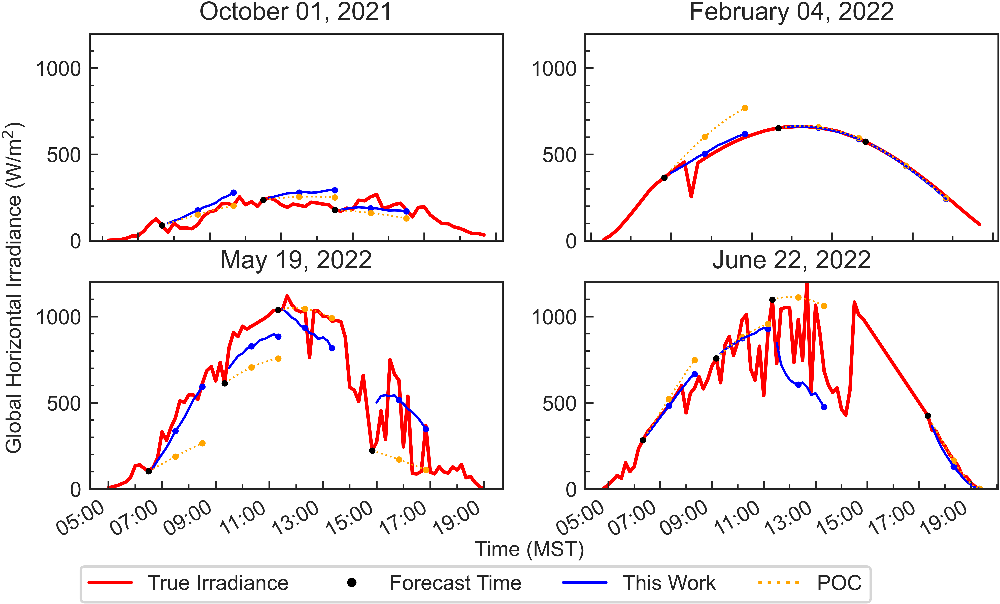

In [5]:
fig, axs = plt.subplots(2, 2, figsize=(7, 4), dpi=1000)

date = datetime.datetime(2021, 10, 1)
i_ = [10, 27, 39]
create_prediction_figure(date, i_, tt, ax=axs[0, 0], fig=fig)

date = datetime.datetime(2022, 2, 4)
i_ = [10, 27, 40]
create_prediction_figure(date, i_, tt, ax=axs[0, 1], fig=fig)

date = datetime.datetime(2022, 5, 19)
i_ = [10, 27, 39, 60]
create_prediction_figure(date, i_, tt, ax=axs[1, 0], fig=fig)

date = datetime.datetime(2022, 6, 22)
i_ = [10, 27, 40, 62]
create_prediction_figure(date, i_, tt, ax=axs[1, 1], fig=fig)

fig.text(
    0.05,
    0.5,
    r"Global Horizontal Irradiance (W/m$^2$)",
    va="center",
    rotation="vertical",
)
fig.text(0.5, 0.1, "Time (MST)", ha="center")

legend_entries = [
    mlines.Line2D([], [], color="red", label="True Irradiance"),
    mlines.Line2D(
        [],
        [],
        color="black",
        marker="o",
        linestyle="None",
        markersize=3,
        label="Forecast Time",
    ),
    mlines.Line2D([], [], color="blue", label="This Work"),
    mlines.Line2D([], [], color="orange", linestyle=":", label="POC"),
]
fig.legend(handles=legend_entries, bbox_to_anchor=(0.8, 0.1), ncol=4)
fig.savefig(
    os.path.join("Reports", "Images", "prediction_examples.pdf"),
    bbox_inches="tight",
    dpi=1000,
)

## Images for Graphical Abstract


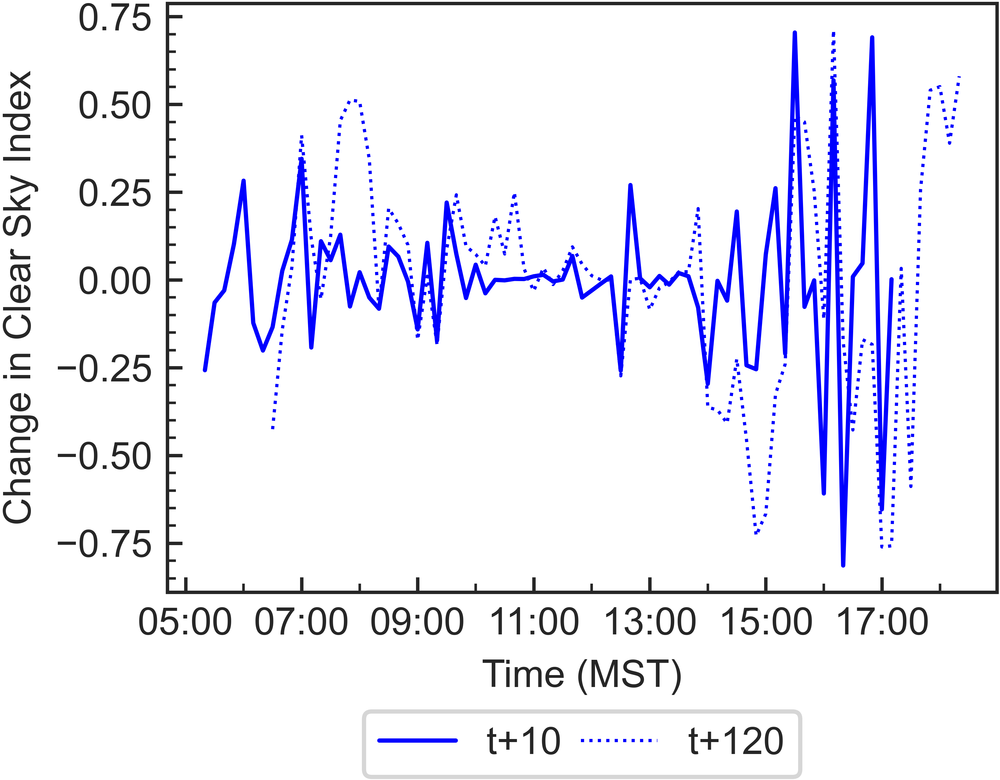

In [15]:
# y_rescaled = (tt.validate_clear_sky_indexes[:,0][:,None] + tt.response_scaler.inverse_transform(y.squeeze())) * tt.validate_clear_sky_irradiances[:,1:]
delta_csi = (
    tt.validate_clear_sky_indexes[:, 1:] - tt.validate_clear_sky_indexes[:, 0][:, None]
)
# persistence = tt.validate_clear_sky_indexes[:,0][:,None] * tt.validate_clear_sky_irradiances[:,1:]
# y_rescaled = tt.rescale_to_GHI(y, tt.validate_clear_sky_irradiances, tt.validate_clear_sky_indexes)
# yp_rescaled = tt.rescale_to_GHI(y_pred, tt.validate_clear_sky_irradiances, tt.validate_clear_sky_indexes)
# persistence = tt.validate_clear_sky_indexes[:,0][:,None] * tt.validate_clear_sky_irradiances[:,1:]
# graph
fig, ax = plt.subplots(figsize=(3.5, 2.5), dpi=1000)
ax.plot(tt.validate_dates[2:, 1], delta_csi[2:, 0], "b-", linewidth=1.0, label="t+10")
ax.plot(
    tt.validate_dates[2:, -5], delta_csi[2:, -5], "b:", linewidth=0.75, label="t+120"
)
# ax.plot(tt.validate_dates[:,1], y_rescaled[:,0], "k.", zorder=0, label="True")
# ax.plot(tt.validate_dates[-1,1:], y_rescaled[-1,:], "k.", zorder=0)

ax.set_ylabel(r"Change in Clear Sky Index")
ax.set_xlabel("Time (MST)")

ax.legend(
    loc="upper center",
    bbox_to_anchor=(0.5, -0.17),
    # fancybox=True, shadow=True,
    ncol=3,
    columnspacing=0.5,
)
# ax.set_ylim(0,1200)
ax.yaxis.set_major_locator(ticker.AutoLocator())
ax.yaxis.set_minor_locator(ticker.AutoMinorLocator())
ax.xaxis.set_major_formatter(DateFormatter("%H:%M", tz=data_df.index.tz))
ax.xaxis.set_major_locator(md.HourLocator(byhour=range(5, 21, 2), tz=data_df.index.tz))
ax.xaxis.set_minor_locator(md.HourLocator(byhour=range(5, 21, 1), tz=data_df.index.tz))

fig.savefig("Reports/Images/abstract_deltacsi.pdf", dpi=1000, bbox_inches="tight")

## Calibration plots

### persistence of Cloudiness


In [38]:
# get model results
model_id = "SOL-334"
# filename = model_id + "_CV1_residuals.h5"
filename = model_id + "_CV3_residuals.h5"
experiment_path = os.path.join(constants.SOLARPROPHET_PATH, "results", filename)

with h5py.File(experiment_path, "r") as f:
    train_intermediate = f["train"]
    test_intermediate = f["validate"]
    results_intermediate = [train_intermediate, test_intermediate]
    results = [
        np.array([i["true"], i["predicted"], i["persistence"]])
        for i in results_intermediate
    ]
true, predicted, persistence = results[1]
print(results[0].shape)
print(true.shape)
train_len = results[0].shape[1]
validation_len = true.shape[0]
print("Prediction Validation MAE")
print(utils.MAE(true, predicted, axis=0), utils.MAE(true, predicted))
print("Persistence Validation MAE")
print(utils.MAE(true, persistence, axis=0), utils.MAE(true, persistence))

validation_count = 13147
val_total_persistence_mae = utils.MAE(
    true, persistence, axis=0
)
val_total_persistence_mae

(3, 65727, 12)
(13147, 12)
Prediction Validation MAE
[45.23360686 54.69409753 62.12921283 67.42908521 72.45254736 76.58981947
 79.28455885 81.83761768 84.82169955 87.45110326 89.12837066 90.41763887] 74.28911317767003
Persistence Validation MAE
[ 99.57851479 105.32686204 113.80732162 120.9679304  128.73175396
 134.48275967 139.06336434 146.15122254 150.59897058 154.5041635
 157.60757229 161.33745   ] 134.3464904781749


array([ 99.57851479, 105.32686204, 113.80732162, 120.9679304 ,
       128.73175396, 134.48275967, 139.06336434, 146.15122254,
       150.59897058, 154.5041635 , 157.60757229, 161.33745   ])

In [25]:
cmap = cm.get_cmap("viridis_r")
cmap2 = cm.get_cmap("plasma_r")

data_min = 1e-6
data_max = 17e-6
n_levels = 17
nondimensional_levels = np.linspace(0, 1, n_levels)
kde_densities = np.linspace(data_min, data_max, n_levels)  # densities used for colorbar
normalizer = Normalize(vmin=data_min, vmax=data_max)  # scales the colors used

/var/folders/s5/91gspn4x2j9c_j33qvjvrlt00000gn/T/ipykernel_25781/4079770499.py:1: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = cm.get_cmap("viridis_r")
/var/folders/s5/91gspn4x2j9c_j33qvjvrlt00000gn/T/ipykernel_25781/4079770499.py:2: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap2 = cm.get_cmap("plasma_r")


In [11]:
if 0:
    fig, axes = plt.subplots(3, 4, figsize=(7, 4), sharex=True, sharey=True, dpi=300)
    cbar_ax = fig.add_axes([0.91, 0.15, 0.03, 0.7])

    for i, ax in enumerate(axes.flatten()):
        time_ahead = 10 + i * 10
        im = sns.kdeplot(
            x=true[-validation_count:, i],
            y=persistence[-validation_count:, i],
            fill=True,
            cmap=cmap,
            ax=ax,
            common_norm=False,
            norm=normalizer,
            levels=nondimensional_levels[1:],
            alpha=0.7,
        )
        ax.plot(
            [0, 1200],
            [0, 1200],
            color="black",
            linestyle="--",
            linewidth=0.7,
            alpha=0.5,
        )
        ax.set_xlim([0, 1200])
        ax.set_ylim([0, 1200])
        ax.set_title(
            rf"$\bf{{{time_ahead}\ Min.}}${val_total_persistence_mae[i]:.2f} MAE",
            size=9,
        )
        # ax.grid(True, linestyle="-", color="gray", alpha=0.25)
        # ax.text(300, 1100, "Overprediction", horizontalalignment="center", size=12)
        # ax.text(850, 100, "Underprediction", horizontalalignment="center", size=12)

    fig.colorbar(
        cm.ScalarMappable(norm=normalizer, cmap=cmap),
        label="Density",
        cax=cbar_ax,
        ticks=kde_densities,
        values=kde_densities,
    )

    fig.tight_layout(rect=[0, 0, 0.91, 1])
    fig.text(0.5, -0.02, r"True Irradiance (W/m$^2$)", ha="center")
    fig.text(
        -0.01, 0.5, r"Predicted Irradiance (W/m$^2$)", va="center", rotation="vertical"
    )
    fig.subplots_adjust(wspace=0.1)
    fig.subplots_adjust(hspace=0.3)

    fig.savefig(
        os.path.join("Reports", "Images", "persistence_kde.png"),
        bbox_inches="tight",
        dpi=1000,
    )
    fig.savefig(
        os.path.join("Reports", "Images", "persistence_kde.svg"),
        bbox_inches="tight",
        dpi=1000,
    )
    fig.savefig(
        os.path.join("Reports", "Images", "persistence_kde.eps"),
        bbox_inches="tight",
        dpi=1000,
    )
    fig.savefig(
        os.path.join("Reports", "Images", "persistence_kde.pdf"),
        bbox_inches="tight",
        dpi=1000,
    )
    plt.show()

### Prediction Calibration Plot

In [28]:
if 0:
    fig, axes = plt.subplots(3, 4, figsize=(7, 4), sharex=True, sharey=True, dpi=300)
    cbar_ax = fig.add_axes([0.91, 0.15, 0.03, 0.7])

    for i, ax in enumerate(axes.flatten()):
        time_ahead = 10 + i * 10
        im = sns.kdeplot(
            x=true[-validation_count:, i],
            y=predicted[-validation_count:, i],
            fill=True,
            cmap=cmap,
            ax=ax,
            common_norm=False,
            norm=normalizer,
            levels=nondimensional_levels[1:],
            alpha=0.7,
        )
        ax.plot(
            [0, 1200],
            [0, 1200],
            color="black",
            linestyle="--",
            linewidth=0.7,
            alpha=0.5,
        )
        ax.set_xlim([0, 1200])
        ax.set_ylim([0, 1200])
        ax.set_title(rf"$\bf{{{time_ahead}\ Min.}}${val_total_mae[i]:.2f} MAE", size=9)
        # ax.grid(True, linestyle="-", color="gray", alpha=0.25)
        # ax.text(300, 1100, "Overprediction", horizontalalignment="center", size=12)
        # ax.text(850, 100, "Underprediction", horizontalalignment="center", size=12)

    fig.colorbar(
        cm.ScalarMappable(norm=normalizer, cmap=cmap),
        label="Density",
        cax=cbar_ax,
        ticks=kde_densities,
        values=kde_densities,
    )

    fig.tight_layout(rect=[0, 0, 0.91, 1])
    fig.text(0.5, -0.02, r"True Irradiance (W/m$^2$)", ha="center")
    fig.text(
        -0.01, 0.5, r"Predicted Irradiance (W/m$^2$)", va="center", rotation="vertical"
    )
    fig.subplots_adjust(wspace=0.1)
    fig.subplots_adjust(hspace=0.3)

    fig.savefig(
        os.path.join("Reports", "Images", "predicted_kde.png"),
        bbox_inches="tight",
        dpi=1000,
    )
    fig.savefig(
        os.path.join("Reports", "Images", "predicted_kde.svg"),
        bbox_inches="tight",
        dpi=1000,
    )
    fig.savefig(
        os.path.join("Reports", "Images", "predicted_kde.eps"),
        bbox_inches="tight",
        dpi=1000,
    )
    fig.savefig(
        os.path.join("Reports", "Images", "predicted_kde.pdf"),
        bbox_inches="tight",
        dpi=1000,
    )
    plt.show()

### persistence and model in one figure


/var/folders/s5/91gspn4x2j9c_j33qvjvrlt00000gn/T/ipykernel_25781/2370338804.py:150: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout(rect=[0, 0, 0.91, 1])


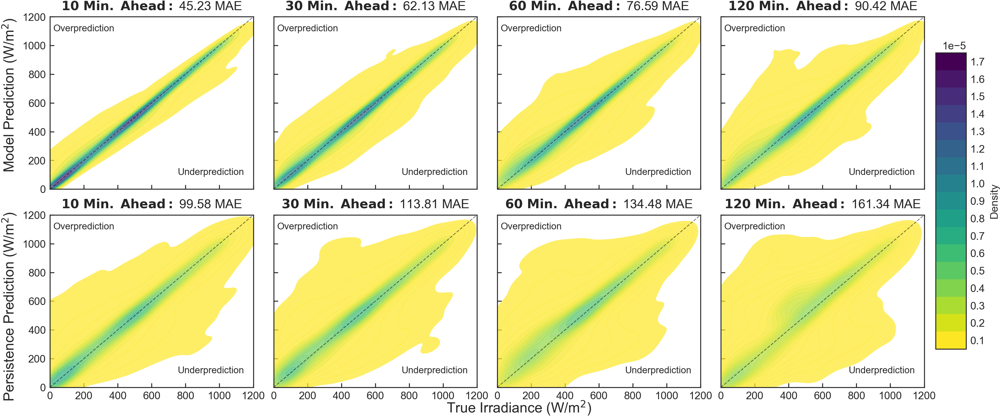

In [32]:
if 1:
    fig, axes = plt.subplots(2, 4, figsize=(12, 5), sharex=True, sharey=True, dpi=300)
    cbar_ax = fig.add_axes([0.91, 0.15, 0.03, 0.7])

    # Model Results
    time_ahead = 10
    im = sns.kdeplot(
        x=true[-validation_count:, 0],
        y=predicted[-validation_count:, 0],
        fill=True,
        cmap=cmap,
        ax=axes[0, 0],
        common_norm=False,
        norm=normalizer,
        levels=nondimensional_levels[1:],
        alpha=0.7,
    )
    axes[0, 0].set_title(
        rf"$\bf{{{time_ahead}\ Min.\ Ahead}}:$ {val_total_mae[0]:.2f} MAE"
    )

    time_ahead = 30
    im = sns.kdeplot(
        x=true[-validation_count:, 2],
        y=predicted[-validation_count:, 2],
        fill=True,
        cmap=cmap,
        ax=axes[0, 1],
        common_norm=False,
        norm=normalizer,
        levels=nondimensional_levels[1:],
        alpha=0.7,
    )
    axes[0, 1].set_title(
        rf"$\bf{{{time_ahead}\ Min.\ Ahead}}:$ {val_total_mae[2]:.2f} MAE"
    )

    time_ahead = 60
    im = sns.kdeplot(
        x=true[-validation_count:, 5],
        y=predicted[-validation_count:, 5],
        fill=True,
        cmap=cmap,
        ax=axes[0, 2],
        common_norm=False,
        norm=normalizer,
        levels=nondimensional_levels[1:],
        alpha=0.7,
    )
    axes[0, 2].set_title(
        rf"$\bf{{{time_ahead}\ Min.\ Ahead}}:$ {val_total_mae[5]:.2f} MAE"
    )

    time_ahead = 120
    im = sns.kdeplot(
        x=true[-validation_count:, -1],
        y=predicted[-validation_count:, -1],
        fill=True,
        cmap=cmap,
        ax=axes[0, 3],
        common_norm=False,
        norm=normalizer,
        levels=nondimensional_levels[1:],
        alpha=0.7,
    )
    axes[0, 3].set_title(
        rf"$\bf{{{time_ahead}\ Min.\ Ahead}}:$ {val_total_mae[-1]:.2f} MAE"
    )

    # Persistence Results
    time_ahead = 10
    im = sns.kdeplot(
        x=true[-validation_count:, 0],
        y=persistence[-validation_count:, 0],
        fill=True,
        cmap=cmap,
        ax=axes[1, 0],
        common_norm=False,
        norm=normalizer,
        levels=nondimensional_levels[1:],
        alpha=0.7,
    )
    axes[1, 0].set_title(
        rf"$\bf{{{time_ahead}\ Min.\ Ahead}}:$ {val_total_persistence_mae[0]:.2f} MAE"
    )

    time_ahead = 30
    im = sns.kdeplot(
        x=true[-validation_count:, 2],
        y=persistence[-validation_count:, 2],
        fill=True,
        cmap=cmap,
        ax=axes[1, 1],
        common_norm=False,
        norm=normalizer,
        levels=nondimensional_levels[1:],
        alpha=0.7,
    )
    axes[1, 1].set_title(
        rf"$\bf{{{time_ahead}\ Min.\ Ahead}}:$ {val_total_persistence_mae[2]:.2f} MAE"
    )

    time_ahead = 60
    im = sns.kdeplot(
        x=true[-validation_count:, 5],
        y=persistence[-validation_count:, 5],
        fill=True,
        cmap=cmap,
        ax=axes[1, 2],
        common_norm=False,
        norm=normalizer,
        levels=nondimensional_levels[1:],
        alpha=0.7,
    )
    axes[1, 2].set_title(
        rf"$\bf{{{time_ahead}\ Min.\ Ahead}}:$ {val_total_persistence_mae[5]:.2f} MAE"
    )

    time_ahead = 120
    im = sns.kdeplot(
        x=true[-validation_count:, -1],
        y=persistence[-validation_count:, -1],
        fill=True,
        cmap=cmap,
        ax=axes[1, 3],
        common_norm=False,
        norm=normalizer,
        levels=nondimensional_levels[1:],
        alpha=0.7,
    )
    axes[1, 3].set_title(
        rf"$\bf{{{time_ahead}\ Min.\ Ahead}}:$ {val_total_persistence_mae[-1]:.2f} MAE"
    )

    for i, ax in enumerate(axes.flatten()):
        ax.plot(
            [0, 1200],
            [0, 1200],
            color="black",
            linestyle="--",
            linewidth=0.7,
            alpha=0.5,
        )
        ax.set_xlim([0, 1200])
        ax.set_ylim([0, 1200])
        # ax.grid(True, linestyle="-", color="gray", alpha=0.25)
        ax.text(200, 1100, "Overprediction", horizontalalignment="center", size=8)
        ax.text(950, 100, "Underprediction", horizontalalignment="center", size=8)

    fig.tight_layout(rect=[0, 0, 0.91, 1])
    fig.text(0.5, 0.00, r"True Irradiance (W/m$^2$)", ha="center", size=12)
    fig.text(
        -0.01,
        0.75,
        r"Model Prediction (W/m$^2$)",
        va="center",
        rotation="vertical",
        size=12,
    )
    fig.text(
        -0.01,
        0.25,
        r"Persistence Prediction (W/m$^2$)",
        va="center",
        rotation="vertical",
        size=12,
    )
    fig.colorbar(
        cm.ScalarMappable(norm=normalizer, cmap=cmap),
        label="Density",
        cax=cbar_ax,
        ticks=kde_densities,
        values=kde_densities,
    )
    fig.subplots_adjust(wspace=0.1)
    fig.subplots_adjust(hspace=0.15)

    fig.savefig(
        os.path.join("Figures", "prediction_and_persistence_kde.pdf"),
        bbox_inches="tight",
        dpi=1000,
    )

    plt.show()

## Overall Error Figures

MAE

In [47]:
print("Prediction Validation MAE")
print(val_predicted_mae := utils.MAE(true, predicted, axis=0), utils.MAE(true, predicted))
print("Persistence Validation MAE")
print(val_persistence_mae := utils.MAE(true, persistence, axis=0), utils.MAE(true, persistence))

Prediction Validation MAE
[45.23360686 54.69409753 62.12921283 67.42908521 72.45254736 76.58981947
 79.28455885 81.83761768 84.82169955 87.45110326 89.12837066 90.41763887] 74.28911317767003
Persistence Validation MAE
[ 99.57851479 105.32686204 113.80732162 120.9679304  128.73175396
 134.48275967 139.06336434 146.15122254 150.59897058 154.5041635
 157.60757229 161.33745   ] 134.3464904781749


RMSE


In [45]:
val_predicted_rmse = utils.RMSE(
    true[-validation_count:], predicted[-validation_count:], axis=0
)
val_persistence_rmse = utils.RMSE(
    true[-validation_count:], persistence[-validation_count:], axis=0
)
print(val_predicted_rmse, val_persistence_rmse)

utils.RMSE(
    true[-validation_count:], predicted[-validation_count:]
)

[101.99919175 114.67804629 123.76366392 130.38362568 135.90641917
 140.44700903 142.84345525 145.95272511 150.79567738 153.54471237
 156.19701299 158.13126416] [237.25902884 228.57461036 233.93585071 237.02326823 242.9188458
 245.79251478 248.24762146 256.10199329 258.91095417 262.62710845
 266.09589311 270.22336974]


138.8923174469148

nMAP

In [50]:
val_predicted_nmap = utils.nMAE(
    true[-validation_count:], predicted[-validation_count:], axis=0
)
val_predicted_nmap, val_predicted_nmap.mean()

(array([0.10163601, 0.12124419, 0.13613007, 0.14630714, 0.156146  ,
        0.16413407, 0.16921094, 0.17440046, 0.18079507, 0.18680713,
        0.19115073, 0.19507839]),
 0.1602533509977946)

Forecast Skill Score (MAE)


In [58]:
1 - val_predicted_mae / val_persistence_mae, np.mean(1 - val_predicted_mae / val_persistence_mae)

(array([0.54574933, 0.48072034, 0.45408422, 0.4425871 , 0.43718201,
        0.43048596, 0.42986739, 0.44004835, 0.43677105, 0.43398869,
        0.43449182, 0.43957439]),
 0.450462555027497)

Forecast Skill Score (RMSE)

In [54]:
1 - val_predicted_rmse / val_persistence_rmse, np.mean(1 - val_predicted_rmse / val_persistence_rmse)

(array([0.57009353, 0.49829053, 0.47095042, 0.44991213, 0.44052748,
        0.42859526, 0.42459285, 0.43009922, 0.41757707, 0.41535086,
        0.4130048 , 0.41481277]),
 0.4478172430168063)

## Comparison with Literature


In [57]:
# literature results
from data.literature_results import (
    Feng_2020,
    Feng_2022,
    Allaham_2020_TSI,
    Allaham_2020_ASI,
)

feng_2020_rmse = Feng_2020["results_rmse"].get(Feng_2020.get("best_model"))
feng_2022_rmse = Feng_2022["results_rmse"].get(Feng_2022.get("best_model"))
allaham_asi_rmse = Allaham_2020_ASI["results_rmse"].get(
    Allaham_2020_ASI.get("best_model")
)
allaham_tsi_rmse = Allaham_2020_TSI["results_rmse"].get(
    Allaham_2020_TSI.get("best_model")
)

feng_2022_fs = Feng_2022["results_fs"].get(Feng_2022.get("best_model"))
feng_2022_fs

array([[10.    ,  0.2145],
       [20.    ,  0.203 ],
       [30.    ,  0.2494],
       [40.    ,  0.2917],
       [50.    ,  0.3435],
       [60.    ,  0.3932]])

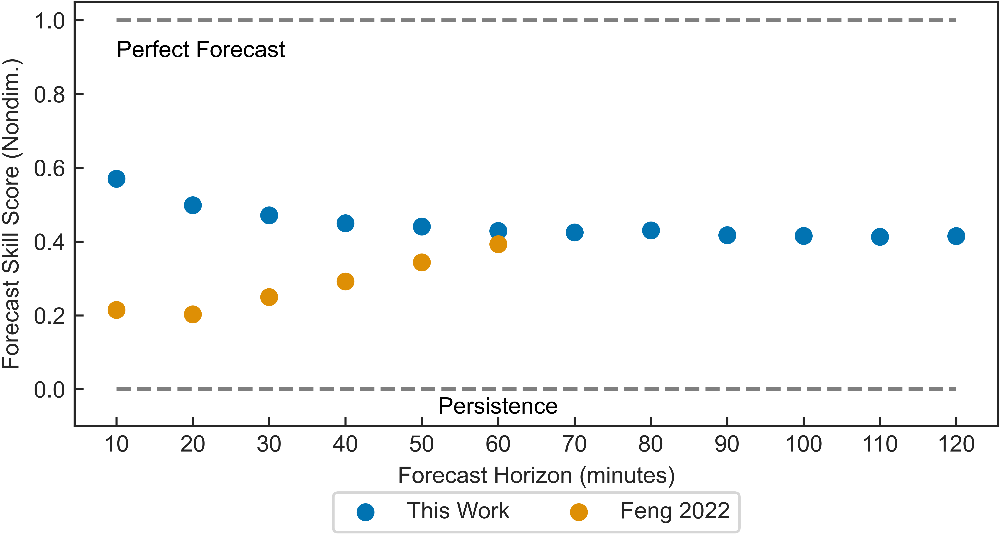

In [66]:
fig, ax = plt.subplots(1,1, figsize=(6.48, 3), dpi=1000)

ax.scatter(np.linspace(10, 120, 12), 1 - val_predicted_rmse / val_persistence_rmse, label="This Work")
ax.scatter(feng_2022_fs[:,0], feng_2022_fs[:,1], label="Feng 2022")

ax.hlines([0,1], 10, 120, linestyle="--", color="black", alpha=0.5)

ax.set_ylabel(r"Forecast Skill Score (Nondim.)")
ax.set_xlabel(r"Forecast Horizon (minutes)")

ax.text(10, 0.9, "Perfect Forecast", ha="left", color="black", alpha=1)
ax.text(60, -0.05, "Persistence", ha="center", va="center", color="black", alpha=1)

x_ticks = np.arange(10, 130, 10)
ax.set_xticks(x_ticks)
ax.set_ylim(-0.1, 1.05)

ax.legend(bbox_to_anchor=(0.5, -0.13), loc='upper center', ncol=2)

fig.savefig(os.path.join(fig_dir, "forecast_skill_score.pdf"), dpi=1000, bbox_inches="tight")

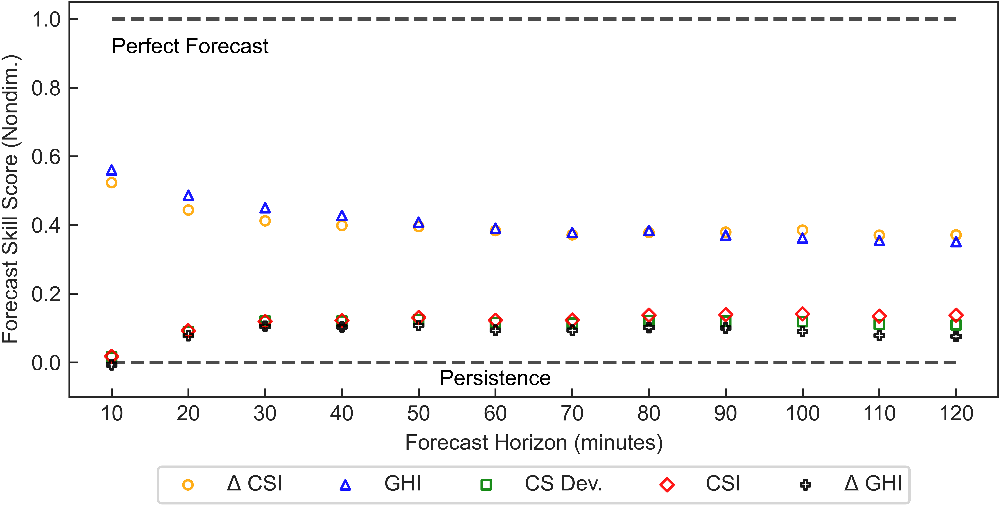

In [101]:
# MAE Forecst Skill
x = np.arange(10, 130, 10)
y = clipped_df[FS_validate_cols].values[:5]
labels = labels
labels = [r"$\Delta$ CSI", r"GHI", r"CS Dev.", r"CSI", r"$\Delta$ GHI"]

fig, ax = plt.subplots(figsize=(7, 3), dpi=1000)
for i in range(len(y)):
    ax.scatter(
        x,
        y[i],
        label=labels[i],
        marker=markers[i],
        alpha=0.9,
        s=15,
        facecolors="none",
        edgecolors=["orange", "blue", "green", "red", "black"][i],
    )

ax.hlines([1, 0], 10, 120, linestyle="dashed", color="black", alpha=0.7)

ax.legend(loc="upper center", bbox_to_anchor=(0.5, -0.15), ncol=5)

# ax.grid()
ax.set_ylabel(r"Forecast Skill Score (Nondim.)")
ax.set_xlabel(r"Forecast Horizon (minutes)")

ax.text(10, 0.9, "Perfect Forecast", ha="left", color="black", alpha=1)
ax.text(60, -0.05, "Persistence", ha="center", va="center", color="black", alpha=1)

x_ticks = np.arange(10, 130, 10)
ax.set_xticks(x_ticks)
ax.set_ylim(-0.1, 1.05)

fig.savefig(
    os.path.join(fig_dir, "forecast_skill.pdf"),
    bbox_inches="tight",
    dpi=1000,
)
# fig.savefig(os.path.join("Reports","Images", "forecast_skill.png"), bbox_inches='tight', dpi=1000)
plt.show()

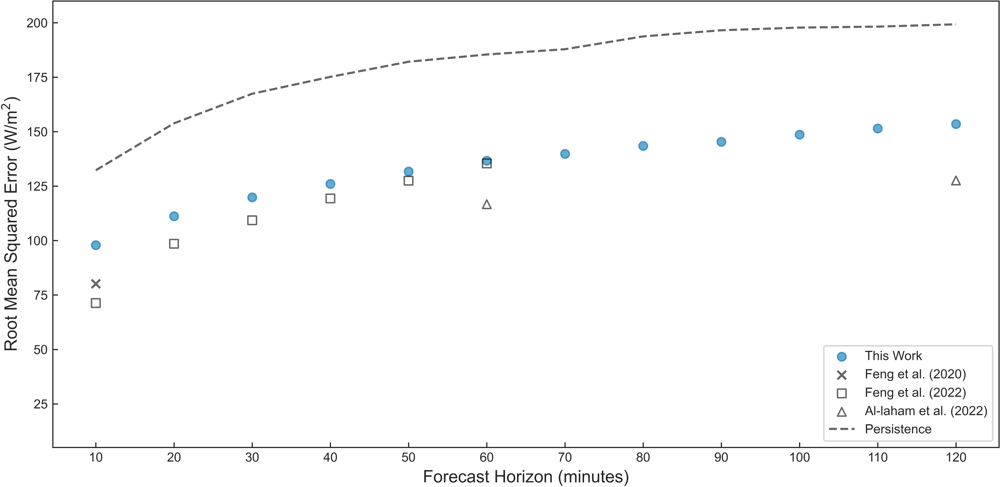

In [9]:
# RMSE v Forecast horizon
RMSE_train_cols = [f"CV 3: Train RMSE t+{i+1}0 min" for i in range(12)]
RMSE_validate_cols = [f"CV 3: Validate RMSE t+{i+1}0 min" for i in range(12)]
RMSE_validate_persistence_cols = [
    f"CV 3: Validate Persistence RMSE t+{i+1}0 min" for i in range(12)
]
RMSE_FS_train_cols = [f"CV 3: Train FS RMSE t+{i+1}0 min" for i in range(12)]
RMSE_FS_validate_cols = [f"CV 3: Validate FS RMSE t+{i+1}0 min" for i in range(12)]

x = np.arange(10, 130, 10)
y = clipped_df[RMSE_validate_cols].values
yy = clipped_df[RMSE_validate_persistence_cols].values[2]
# labels = clipped_df["selected responses"].values
labels = ["  TabSoF  "]
markers = ["o", "^", "s", "D", "P"]

fig, ax = plt.subplots(figsize=(10, 5), dpi=1000)
for i in [0]:
    # ax.scatter(x, y[i], label=labels[i][2:-2], marker=markers[i], alpha=0.6)
    ax.scatter(x, y[i], label="This Work", marker=markers[i], alpha=0.6)

# literature results
ax.scatter(
    feng_2020_rmse.T[0],
    feng_2020_rmse.T[1],
    marker="x",
    label="Feng et al. (2020)",
    color="black",
    alpha=0.6,
)
ax.scatter(
    feng_2022_rmse.T[0],
    feng_2022_rmse.T[1],
    marker="s",
    facecolors="none",
    label="Feng et al. (2022)",
    color="black",
    alpha=0.6,
)
ax.scatter(
    allaham_asi_rmse.T[0][1:3],
    allaham_asi_rmse.T[1][1:3],
    marker="^",
    facecolors="none",
    label="Al-laham et al. (2022)",
    color="black",
    alpha=0.6,
)

ax.plot(x, yy, label="Persistence", color="black", linestyle="--", alpha=0.6)

ax.set_ylim(5, 210)
# ax.grid()
ax.set_ylabel(r"Root Mean Squared Error (W/m$^2$)", fontsize=12)
ax.set_xlabel(r"Forecast Horizon (minutes)", fontsize=12)

x_ticks = np.arange(10, 130, 10)
ax.set_xticks(x_ticks)

plt.legend(loc="lower right")
fig.tight_layout()
# plt.savefig(os.path.join(fig_dir, "RMSE v Forecast horizon.png"), bbox_inches="tight")
plt.savefig(os.path.join(fig_dir, "RMSE v Forecast horizon.pdf"), bbox_inches="tight")

plt.show()

nMAP calculations


In [3]:
# open residuals file
model_id = "SOL-267"
filename = model_id + "_CV3_residuals.h5"
experiment_path = os.path.join(constants.SOLARPROPHET_PATH, "results", filename)

with h5py.File(experiment_path, "r") as f:
    train_intermediate = f["train"]
    test_intermediate = f["validate"]
    results_intermediate = [train_intermediate, test_intermediate]
    results = [
        np.array([i["true"], i["predicted"], i["persistence"]])
        for i in results_intermediate
    ]

In [7]:
errors = results[0][0] - results[0][1]
utils.nMAE(results[0][0], results[0][1], axis=0)

array([0.10967971, 0.13183147, 0.14628976, 0.15781824, 0.16710271,
       0.17482936, 0.18264589, 0.18886018, 0.19499823, 0.20063978,
       0.20613582, 0.21206239])

model architecture


In [8]:
import tensorboard

In [9]:
# inputs
model_name = "SOL-342_CV3"

# # initialize model
# tt = TabularTest(
#     # Required Parameters
#     n_steps_in=1,
#     n_steps_out=12,
#     selected_features=[
#         "BRBG Total Cloud Cover [%]",
#         "CSI GHI",
#         "dni t-4",
#         "940nm POM-01 Photometer [uA]",
#         "cs_dev_mean t-10 dni",
#         "675nm POM-01 Photometer [uA]",
#         "CSI DNI",
#         "elevation",
#         "cs_dev t dni",
#         "dni t-9",
#     ],
#     # selected_features=constants.PAST_FEATURES,
#     selected_groups=None,
#     selected_responses=["Delta CSI GHI"],
#     scaler_type="minmax",
#     data_path=constants.JOINT_DATA_H5_PATH,
#     ## Saving and cache parameters (optional)
#     model_save_path="results",
#     datetimes_cache_path=constants.DATETIME_VALUES_PATH,
#     window_cache_path=os.path.join("data", "windows_cache.h5"),
#     all_past_features=constants.PAST_FEATURES,
#     all_future_features=constants.FUTURE_FEATURES,
#     all_scalar_responses=constants.SCALAR_RESPONSES,
#     all_relative_responses=constants.RELATIVE_RESPONSES,
#     # Model (optional)
#     model=None,
#     model_name="TimeDistributed_CNN-LSTM-MLP",
#     # Optimizer and training tuning parameters (optional)
#     scale_responses=True,
#     epochs=3000,
#     shuffle_training_order=False,
#     batch_size=4000,
#     loss="mae",
#     optimizer=None,
#     learning_rate=tf.optimizers.schedules.CosineDecayRestarts(
#         1e-2,  # initial learning rate
#         500,  # number of steps to initially decay over
#         t_mul=4,  # number of times to restart
#         m_mul=0.5,  # restart maximum learning rate multiplier
#         alpha=0,
#     ),
#     callbacks=[],
#     early_stopping=True,
#     stopping_patience=1000,
#     stopping_min_delta=1e-4,
#     metrics=[],  # todo possibly replace
#     fit_verbose=1,
#     # Utility Parameters (optional)
#     data_cols=constants.DATA_COLS,
#     feature_groups=constants.FEATURE_GROUPS,
#     scalar_response=constants.SCALAR_RESPONSES,
#     relative_response=constants.RELATIVE_RESPONSES,
#     seed=42,
#     n_job_workers=1,
#     # Neptune Parameters (optional)
#     neptune_log=False,
#     neptune_run_name=f"Fine Tuning Feature number",
#     tags=["CV2", "Time Steps"],
# )
tt.model = tf.keras.models.load_model(os.path.join(".", "results", model_name))

In [10]:
tt.model.summary()

Model: "NoiseModel"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 NoiseInputs (InputLayer)       [(None, 1)]          0           []                               
                                                                                                  
 NoiseInputsExpanded (Lambda)   (None, 1, 1)         0           ['NoiseInputs[0][0]']            
                                                                                                  
 PastInputs (InputLayer)        [(None, 1, 10)]      0           []                               
                                                                                                  
 dense (Dense)                  (None, 1, 1)         1           ['NoiseInputsExpanded[0][0]']    
                                                                                         

In [11]:
tf.keras.utils.plot_model(
    tt.model, show_shapes=True, expand_nested=True, show_dtype=True
)

You must install pydot (`pip install pydot`) and install graphviz (see instructions at https://graphviz.gitlab.io/download/) for plot_model to work.


## Noise Model Analysis

In [16]:
# Noise Model Results
run_ids = [
    # Noise Model: False, all features
    [330, 336, 345],
    # Noise Model: False, Top 10 features
    [311, 312, 348],
    # Noise Model: True, all features
    [280, 281, 339],
    # Noise Model: True, Top 10 features
    [272, 266, 334]
]

mae_values = np.zeros((4, 3))

p_values = np.zeros((2, 3))

In [17]:
import scipy.stats as stats

for CVi in range(3):
    for feature_set_i in range(2):
        nm_false = run_ids[feature_set_i][CVi]
        nm_true = run_ids[feature_set_i + 2][CVi]

        nm_false_filename = os.path.join("results", f"SOL-{nm_false}_CV{CVi+1}_residuals.h5")
        nm_true_filename = os.path.join("results", f"SOL-{nm_true}_CV{CVi+1}_residuals.h5")

        with h5py.File(nm_false_filename, "r") as f1, h5py.File(nm_true_filename, "r") as f2:
            nm_false_mae = np.abs(f1["validate"]["true"][()] - f1["validate"]["predicted"][()]).mean(axis=1)
            nm_true_mae = np.abs(f2["validate"]["true"][()] - f2["validate"]["predicted"][()]).mean(axis=1)
        
        mae_values[feature_set_i, CVi] = np.mean(nm_false_mae)
        mae_values[feature_set_i + 2, CVi] = np.mean(nm_true_mae)
        _, p_values[feature_set_i, CVi] = stats.ttest_ind(nm_false_mae, nm_true_mae, alternative="greater")
        

In [18]:
mae_values

array([[89.35017886, 76.85116895, 73.77014885],
       [94.6087897 , 83.92802504, 75.55713402],
       [91.06523973, 76.42037033, 74.78765097],
       [88.96170455, 76.00889883, 74.28911318]])

In [14]:
p_values

array([[9.41321046e-01, 3.33730113e-01, 8.23538413e-01],
       [1.08314539e-07, 1.44210415e-15, 1.22412895e-01]])

## Model Results Summary

In [19]:
results_id = 334
cvi = 3
filename = f"results/SOL-{results_id}_CV{cvi}_residuals.h5"

with h5py.File(filename, "r") as f:
    g = f["validate"]
    true = g["true"][()]
    predicted = g["predicted"][()]
    persistence = g["persistence"][()]
    
# MAE, RMSE, nMAP, FS for overall and 10-120 min
mae = utils.MAE(true, predicted, axis=0)


In [20]:
mae

array([45.23360686, 54.69409753, 62.12921283, 67.42908521, 72.45254736,
       76.58981947, 79.28455885, 81.83761768, 84.82169955, 87.45110326,
       89.12837066, 90.41763887])

In [70]:
8*288*352*3

2433024